In [1]:
pip install fedlab==1.3.0


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip3.10 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [62]:
import torch
import torchvision

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os
import json
import math

from fedlab.utils.dataset.partition import CIFAR10Partitioner
from fedlab.utils.functional import partition_report

# num_clients = 10
num_clients = 100

num_classes = 10
seed = 2021
hist_color = '#4169E1'

In [5]:
trainset = torchvision.datasets.CIFAR10(root="../../../../data/CIFAR10/",
                                        train=True, download=True)

Files already downloaded and verified


## Hetero-Dirichlet

In [4]:
hetero_dir_part = CIFAR10Partitioner(trainset.targets,
                                     num_clients,
                                     balance=None,
                                     partition="dirichlet",
                                     dir_alpha=0.1,
                                     seed=seed)

In [5]:
hetero_dir_part.client_dict

{0: array([15142, 17769,  3045, 42279, 21114, 49583, 13906, 31483,  1263,
        46493, 49453, 17535,  7594, 41508, 48863, 49773, 33887, 12793,
        41214,  1277, 34196,  8758,   147, 35116, 38304, 44182, 28984,
         3079, 32745, 31760, 31527, 48093, 19377, 41977, 32766, 36507,
        30853,  4364, 31923, 48331,  3267, 47426, 40506, 36651, 34078,
        33665, 33144,  3531,  7244, 11399, 41054, 29435, 47636,  7418,
         6066, 28123, 10806, 24048, 16809, 49596, 29423, 48680, 43165,
        47367, 20420, 31162, 45560,  1114, 16293, 43456, 42855, 45841,
        21400, 45658, 31524, 20229, 18372, 47154, 19717, 40781, 36109,
         9807, 35461, 39754, 13919, 20385, 14953, 44339, 18877,  6784,
        34800, 42714,  6546, 46355, 36512, 48568, 35579,  1534, 34049,
        37629, 21926, 24310,  1043, 43126, 26859,   828, 28120,  2838,
        47086, 40338, 17452, 47504, 31838, 20593, 35375,  5009, 24615,
        41633, 31797, 14985, 42369, 45275, 30558,  3247,  8943,  1462,
   

In [6]:
csv_file = "./partition_reports/cifar10_hetero_dir_0.1_100clients.csv"
partition_report(trainset.targets, hetero_dir_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

In [7]:
hetero_dir_part_df = pd.read_csv(csv_file,header=1)
hetero_dir_part_df = hetero_dir_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    hetero_dir_part_df[col] = (hetero_dir_part_df[col] * hetero_dir_part_df['Amount']).astype(int)

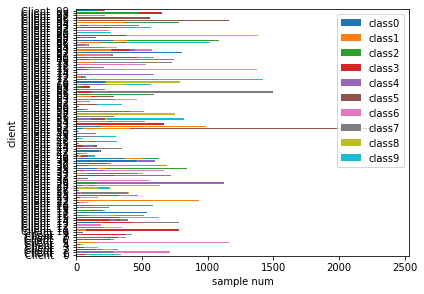

In [11]:
hetero_dir_part_df[col_names].iloc[:100].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_hetero_dir_0.1_100clients.pdf")

In [8]:
import pandas as pd
pd.set_option('mode.use_inf_as_na', True)
import matplotlib.pyplot as plt

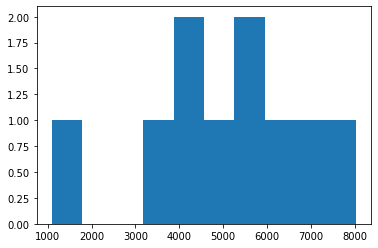

In [9]:
clt_sample_num_df = hetero_dir_part.client_sample_count
plt.hist(x=clt_sample_num_df)
plt.savefig(f"./imgs/cifar10_hetero_dir_0.3_10clients_dist.png", dpi=400, bbox_inches = 'tight')

In [10]:
clt_sample_num_df

,num_samples
client,
0,5358
1,6871
2,4325
3,3391
4,4130
5,5347
6,6367
7,1090
8,5086


## Shards

In [11]:
num_shards = 200
shards_part = CIFAR10Partitioner(trainset.targets,
                                 num_clients,
                                 balance=None,
                                 partition="shards",
                                 num_shards=num_shards,
                                 seed=seed)

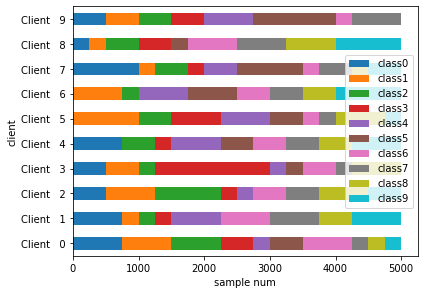

In [12]:
csv_file = "./partition_reports/cifar10_shards_10clients.csv"
partition_report(trainset.targets, shards_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

shards_part_df = pd.read_csv(csv_file,header=1)
shards_part_df = shards_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    shards_part_df[col] = (shards_part_df[col] * shards_part_df['Amount']).astype(int)

shards_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_shards_10clients.png", dpi=400)

## Balanced IID

In [13]:
balanced_iid_part = CIFAR10Partitioner(trainset.targets,
                                      num_clients,
                                      balance=True,
                                      partition="iid",
                                      seed=seed)

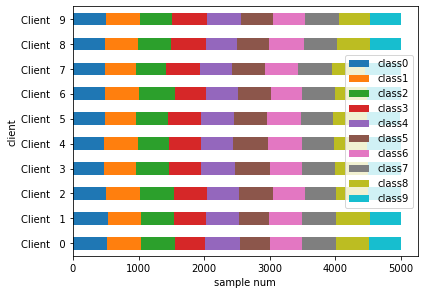

In [14]:
csv_file = "./partition_reports/cifar10_balanced_iid_10clients.csv"
partition_report(trainset.targets, balanced_iid_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

balanced_iid_part_df = pd.read_csv(csv_file,header=1)
balanced_iid_part_df = balanced_iid_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    balanced_iid_part_df[col] = (balanced_iid_part_df[col] * balanced_iid_part_df['Amount']).astype(int)

balanced_iid_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_balanced_iid_10clients.png", dpi=400)

## Unbalanced IID

In [15]:
unbalanced_iid_part = CIFAR10Partitioner(trainset.targets,
                                        num_clients,
                                        balance=False,
                                        partition="iid",
                                        unbalance_sgm=0.3,
                                        seed=seed)

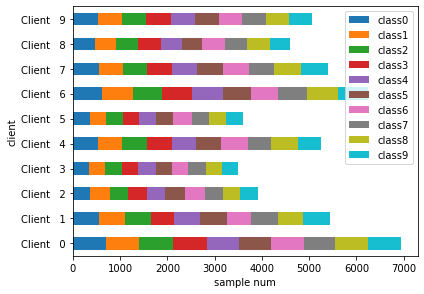

In [16]:
csv_file = "./partition_reports/cifar10_unbalanced_iid_10clients.csv"
partition_report(trainset.targets, unbalanced_iid_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

unbalanced_iid_part_df = pd.read_csv(csv_file,header=1)
unbalanced_iid_part_df = unbalanced_iid_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    unbalanced_iid_part_df[col] = (unbalanced_iid_part_df[col] * unbalanced_iid_part_df['Amount']).astype(int)

unbalanced_iid_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_unbalanced_iid_10clients.png", dpi=400)

## Balanced dirichlet (B=0.1)

In [49]:
balanced_dir0_1_part = CIFAR10Partitioner(trainset.targets,
                                      num_clients,
                                      balance=True,
                                      partition="dirichlet",
                                      dir_alpha=0.1,
                                      seed=seed)

Remaining Data: 50000
Remaining Data: 49999
Remaining Data: 49998
Remaining Data: 49997
Remaining Data: 49996
Remaining Data: 49995
Remaining Data: 49994
Remaining Data: 49993
Remaining Data: 49992
Remaining Data: 49991
Remaining Data: 49990
Remaining Data: 49989
Remaining Data: 49988
Remaining Data: 49987
Remaining Data: 49986
Remaining Data: 49985
Remaining Data: 49984
Remaining Data: 49983
Remaining Data: 49982
Remaining Data: 49981
Remaining Data: 49980
Remaining Data: 49979
Remaining Data: 49978
Remaining Data: 49977
Remaining Data: 49976
Remaining Data: 49975
Remaining Data: 49974
Remaining Data: 49973
Remaining Data: 49972
Remaining Data: 49971
Remaining Data: 49970
Remaining Data: 49969
Remaining Data: 49968
Remaining Data: 49967
Remaining Data: 49966
Remaining Data: 49965
Remaining Data: 49964
Remaining Data: 49963
Remaining Data: 49962
Remaining Data: 49961
Remaining Data: 49960
Remaining Data: 49959
Remaining Data: 49958
Remaining Data: 49957
Remaining Data: 49956
Remaining 

Remaining Data: 18690
Remaining Data: 18689
Remaining Data: 18688
Remaining Data: 18687
Remaining Data: 18686
Remaining Data: 18685
Remaining Data: 18684
Remaining Data: 18683
Remaining Data: 18682
Remaining Data: 18681
Remaining Data: 18680
Remaining Data: 18679
Remaining Data: 18678
Remaining Data: 18677
Remaining Data: 18676
Remaining Data: 18675
Remaining Data: 18674
Remaining Data: 18673
Remaining Data: 18672
Remaining Data: 18671
Remaining Data: 18670
Remaining Data: 18669
Remaining Data: 18668
Remaining Data: 18667
Remaining Data: 18666
Remaining Data: 18665
Remaining Data: 18664
Remaining Data: 18663
Remaining Data: 18662
Remaining Data: 18661
Remaining Data: 18660
Remaining Data: 18659
Remaining Data: 18658
Remaining Data: 18657
Remaining Data: 18656
Remaining Data: 18655
Remaining Data: 18654
Remaining Data: 18653
Remaining Data: 18652
Remaining Data: 18651
Remaining Data: 18650
Remaining Data: 18649
Remaining Data: 18648
Remaining Data: 18647
Remaining Data: 18646
Remaining 

Remaining Data: 4001
Remaining Data: 4000
Remaining Data: 3999
Remaining Data: 3998
Remaining Data: 3997
Remaining Data: 3996
Remaining Data: 3995
Remaining Data: 3994
Remaining Data: 3993
Remaining Data: 3992
Remaining Data: 3991
Remaining Data: 3990
Remaining Data: 3989
Remaining Data: 3988
Remaining Data: 3987
Remaining Data: 3986
Remaining Data: 3985
Remaining Data: 3984
Remaining Data: 3983
Remaining Data: 3982
Remaining Data: 3981
Remaining Data: 3980
Remaining Data: 3979
Remaining Data: 3978
Remaining Data: 3977
Remaining Data: 3976
Remaining Data: 3975
Remaining Data: 3974
Remaining Data: 3973
Remaining Data: 3972
Remaining Data: 3971
Remaining Data: 3970
Remaining Data: 3969
Remaining Data: 3968
Remaining Data: 3967
Remaining Data: 3966
Remaining Data: 3965
Remaining Data: 3964
Remaining Data: 3963
Remaining Data: 3962
Remaining Data: 3961
Remaining Data: 3960
Remaining Data: 3959
Remaining Data: 3958
Remaining Data: 3957
Remaining Data: 3956
Remaining Data: 3955
Remaining Dat

Remaining Data: 3564
Remaining Data: 3563
Remaining Data: 3562
Remaining Data: 3561
Remaining Data: 3560
Remaining Data: 3559
Remaining Data: 3558
Remaining Data: 3557
Remaining Data: 3556
Remaining Data: 3555
Remaining Data: 3554
Remaining Data: 3553
Remaining Data: 3552
Remaining Data: 3551
Remaining Data: 3550
Remaining Data: 3549
Remaining Data: 3548
Remaining Data: 3547
Remaining Data: 3546
Remaining Data: 3545
Remaining Data: 3544
Remaining Data: 3543
Remaining Data: 3542
Remaining Data: 3541
Remaining Data: 3540
Remaining Data: 3540
Remaining Data: 3539
Remaining Data: 3538
Remaining Data: 3537
Remaining Data: 3536
Remaining Data: 3535
Remaining Data: 3534
Remaining Data: 3533
Remaining Data: 3533
Remaining Data: 3532
Remaining Data: 3531
Remaining Data: 3530
Remaining Data: 3529
Remaining Data: 3528
Remaining Data: 3527
Remaining Data: 3527
Remaining Data: 3526
Remaining Data: 3525
Remaining Data: 3524
Remaining Data: 3523
Remaining Data: 3522
Remaining Data: 3521
Remaining Dat

Remaining Data: 3196
Remaining Data: 3195
Remaining Data: 3194
Remaining Data: 3193
Remaining Data: 3192
Remaining Data: 3191
Remaining Data: 3190
Remaining Data: 3189
Remaining Data: 3188
Remaining Data: 3188
Remaining Data: 3187
Remaining Data: 3186
Remaining Data: 3185
Remaining Data: 3184
Remaining Data: 3183
Remaining Data: 3182
Remaining Data: 3181
Remaining Data: 3180
Remaining Data: 3179
Remaining Data: 3178
Remaining Data: 3177
Remaining Data: 3177
Remaining Data: 3176
Remaining Data: 3175
Remaining Data: 3175
Remaining Data: 3174
Remaining Data: 3173
Remaining Data: 3173
Remaining Data: 3172
Remaining Data: 3171
Remaining Data: 3170
Remaining Data: 3169
Remaining Data: 3168
Remaining Data: 3167
Remaining Data: 3166
Remaining Data: 3165
Remaining Data: 3164
Remaining Data: 3163
Remaining Data: 3162
Remaining Data: 3161
Remaining Data: 3160
Remaining Data: 3159
Remaining Data: 3158
Remaining Data: 3157
Remaining Data: 3156
Remaining Data: 3155
Remaining Data: 3154
Remaining Dat

Remaining Data: 2836
Remaining Data: 2836
Remaining Data: 2835
Remaining Data: 2834
Remaining Data: 2833
Remaining Data: 2832
Remaining Data: 2831
Remaining Data: 2830
Remaining Data: 2829
Remaining Data: 2828
Remaining Data: 2827
Remaining Data: 2826
Remaining Data: 2825
Remaining Data: 2824
Remaining Data: 2823
Remaining Data: 2822
Remaining Data: 2821
Remaining Data: 2820
Remaining Data: 2819
Remaining Data: 2818
Remaining Data: 2817
Remaining Data: 2816
Remaining Data: 2815
Remaining Data: 2814
Remaining Data: 2814
Remaining Data: 2813
Remaining Data: 2812
Remaining Data: 2812
Remaining Data: 2811
Remaining Data: 2810
Remaining Data: 2809
Remaining Data: 2809
Remaining Data: 2808
Remaining Data: 2807
Remaining Data: 2806
Remaining Data: 2805
Remaining Data: 2804
Remaining Data: 2803
Remaining Data: 2802
Remaining Data: 2801
Remaining Data: 2800
Remaining Data: 2799
Remaining Data: 2798
Remaining Data: 2797
Remaining Data: 2796
Remaining Data: 2795
Remaining Data: 2794
Remaining Dat

Remaining Data: 2479
Remaining Data: 2479
Remaining Data: 2479
Remaining Data: 2478
Remaining Data: 2478
Remaining Data: 2477
Remaining Data: 2476
Remaining Data: 2475
Remaining Data: 2474
Remaining Data: 2473
Remaining Data: 2472
Remaining Data: 2471
Remaining Data: 2470
Remaining Data: 2470
Remaining Data: 2470
Remaining Data: 2470
Remaining Data: 2469
Remaining Data: 2468
Remaining Data: 2467
Remaining Data: 2466
Remaining Data: 2465
Remaining Data: 2464
Remaining Data: 2463
Remaining Data: 2462
Remaining Data: 2461
Remaining Data: 2460
Remaining Data: 2459
Remaining Data: 2458
Remaining Data: 2457
Remaining Data: 2456
Remaining Data: 2456
Remaining Data: 2455
Remaining Data: 2454
Remaining Data: 2453
Remaining Data: 2452
Remaining Data: 2451
Remaining Data: 2450
Remaining Data: 2449
Remaining Data: 2448
Remaining Data: 2447
Remaining Data: 2446
Remaining Data: 2445
Remaining Data: 2444
Remaining Data: 2443
Remaining Data: 2442
Remaining Data: 2442
Remaining Data: 2442
Remaining Dat

Remaining Data: 2144
Remaining Data: 2143
Remaining Data: 2142
Remaining Data: 2141
Remaining Data: 2140
Remaining Data: 2139
Remaining Data: 2138
Remaining Data: 2137
Remaining Data: 2136
Remaining Data: 2135
Remaining Data: 2134
Remaining Data: 2133
Remaining Data: 2132
Remaining Data: 2131
Remaining Data: 2130
Remaining Data: 2130
Remaining Data: 2129
Remaining Data: 2128
Remaining Data: 2127
Remaining Data: 2126
Remaining Data: 2126
Remaining Data: 2125
Remaining Data: 2124
Remaining Data: 2123
Remaining Data: 2122
Remaining Data: 2122
Remaining Data: 2121
Remaining Data: 2120
Remaining Data: 2119
Remaining Data: 2118
Remaining Data: 2117
Remaining Data: 2117
Remaining Data: 2116
Remaining Data: 2115
Remaining Data: 2114
Remaining Data: 2113
Remaining Data: 2112
Remaining Data: 2111
Remaining Data: 2110
Remaining Data: 2109
Remaining Data: 2109
Remaining Data: 2109
Remaining Data: 2109
Remaining Data: 2108
Remaining Data: 2107
Remaining Data: 2106
Remaining Data: 2105
Remaining Dat

Remaining Data: 1814
Remaining Data: 1813
Remaining Data: 1812
Remaining Data: 1812
Remaining Data: 1811
Remaining Data: 1810
Remaining Data: 1810
Remaining Data: 1810
Remaining Data: 1810
Remaining Data: 1809
Remaining Data: 1808
Remaining Data: 1807
Remaining Data: 1806
Remaining Data: 1805
Remaining Data: 1804
Remaining Data: 1803
Remaining Data: 1802
Remaining Data: 1801
Remaining Data: 1801
Remaining Data: 1801
Remaining Data: 1800
Remaining Data: 1799
Remaining Data: 1798
Remaining Data: 1797
Remaining Data: 1796
Remaining Data: 1795
Remaining Data: 1794
Remaining Data: 1794
Remaining Data: 1793
Remaining Data: 1792
Remaining Data: 1791
Remaining Data: 1791
Remaining Data: 1790
Remaining Data: 1789
Remaining Data: 1789
Remaining Data: 1788
Remaining Data: 1787
Remaining Data: 1786
Remaining Data: 1786
Remaining Data: 1785
Remaining Data: 1784
Remaining Data: 1783
Remaining Data: 1782
Remaining Data: 1781
Remaining Data: 1780
Remaining Data: 1779
Remaining Data: 1778
Remaining Dat

Remaining Data: 1482
Remaining Data: 1481
Remaining Data: 1480
Remaining Data: 1480
Remaining Data: 1479
Remaining Data: 1479
Remaining Data: 1479
Remaining Data: 1479
Remaining Data: 1479
Remaining Data: 1478
Remaining Data: 1477
Remaining Data: 1477
Remaining Data: 1476
Remaining Data: 1476
Remaining Data: 1475
Remaining Data: 1474
Remaining Data: 1473
Remaining Data: 1472
Remaining Data: 1471
Remaining Data: 1470
Remaining Data: 1470
Remaining Data: 1470
Remaining Data: 1469
Remaining Data: 1468
Remaining Data: 1467
Remaining Data: 1466
Remaining Data: 1465
Remaining Data: 1464
Remaining Data: 1463
Remaining Data: 1462
Remaining Data: 1462
Remaining Data: 1461
Remaining Data: 1461
Remaining Data: 1461
Remaining Data: 1461
Remaining Data: 1460
Remaining Data: 1459
Remaining Data: 1458
Remaining Data: 1457
Remaining Data: 1456
Remaining Data: 1455
Remaining Data: 1454
Remaining Data: 1453
Remaining Data: 1452
Remaining Data: 1451
Remaining Data: 1450
Remaining Data: 1450
Remaining Dat

Remaining Data: 1160
Remaining Data: 1159
Remaining Data: 1158
Remaining Data: 1157
Remaining Data: 1157
Remaining Data: 1157
Remaining Data: 1157
Remaining Data: 1156
Remaining Data: 1156
Remaining Data: 1156
Remaining Data: 1156
Remaining Data: 1155
Remaining Data: 1155
Remaining Data: 1154
Remaining Data: 1153
Remaining Data: 1153
Remaining Data: 1152
Remaining Data: 1151
Remaining Data: 1151
Remaining Data: 1150
Remaining Data: 1149
Remaining Data: 1148
Remaining Data: 1148
Remaining Data: 1147
Remaining Data: 1147
Remaining Data: 1146
Remaining Data: 1145
Remaining Data: 1145
Remaining Data: 1144
Remaining Data: 1143
Remaining Data: 1142
Remaining Data: 1141
Remaining Data: 1141
Remaining Data: 1141
Remaining Data: 1140
Remaining Data: 1140
Remaining Data: 1140
Remaining Data: 1139
Remaining Data: 1139
Remaining Data: 1139
Remaining Data: 1138
Remaining Data: 1138
Remaining Data: 1137
Remaining Data: 1136
Remaining Data: 1135
Remaining Data: 1134
Remaining Data: 1133
Remaining Dat

KeyboardInterrupt: 

In [ ]:
csv_file = "./partition_reports/cifar10_balanced_dir0_1_100clients.csv"
partition_report(trainset.targets, balanced_dir0_1_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

balanced_dir0_1_part_df = pd.read_csv(csv_file,header=1)
balanced_dir0_1_part_df = balanced_dir0_1_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    balanced_dir0_1_part_df[col] = (balanced_dir0_1_part_df[col] * balanced_dir0_1_part_df['Amount']).astype(int)

balanced_dir0_1_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_balanced_dir0_1_100clients.png", dpi=400)

## Balanced dirichlet (B=0.5)

In [17]:
balanced_dir0_5_part = CIFAR10Partitioner(trainset.targets,
                                      num_clients,
                                      balance=True,
                                      partition="dirichlet",
                                      dir_alpha=0.5,
                                      seed=seed)

Remaining Data: 50000
Remaining Data: 49999
Remaining Data: 49998
Remaining Data: 49997
Remaining Data: 49996
Remaining Data: 49995
Remaining Data: 49994
Remaining Data: 49993
Remaining Data: 49992
Remaining Data: 49991
Remaining Data: 49990
Remaining Data: 49989
Remaining Data: 49988
Remaining Data: 49987
Remaining Data: 49986
Remaining Data: 49985
Remaining Data: 49984
Remaining Data: 49983
Remaining Data: 49982
Remaining Data: 49981
Remaining Data: 49980
Remaining Data: 49979
Remaining Data: 49978
Remaining Data: 49977
Remaining Data: 49976
Remaining Data: 49975
Remaining Data: 49974
Remaining Data: 49973
Remaining Data: 49972
Remaining Data: 49971
Remaining Data: 49970
Remaining Data: 49969
Remaining Data: 49968
Remaining Data: 49967
Remaining Data: 49966
Remaining Data: 49965
Remaining Data: 49964
Remaining Data: 49963
Remaining Data: 49962
Remaining Data: 49961
Remaining Data: 49960
Remaining Data: 49959
Remaining Data: 49958
Remaining Data: 49957
Remaining Data: 49956
Remaining 

Remaining Data: 10631
Remaining Data: 10630
Remaining Data: 10629
Remaining Data: 10628
Remaining Data: 10627
Remaining Data: 10626
Remaining Data: 10625
Remaining Data: 10624
Remaining Data: 10623
Remaining Data: 10622
Remaining Data: 10621
Remaining Data: 10620
Remaining Data: 10619
Remaining Data: 10618
Remaining Data: 10617
Remaining Data: 10616
Remaining Data: 10615
Remaining Data: 10614
Remaining Data: 10613
Remaining Data: 10612
Remaining Data: 10611
Remaining Data: 10610
Remaining Data: 10609
Remaining Data: 10608
Remaining Data: 10607
Remaining Data: 10606
Remaining Data: 10605
Remaining Data: 10604
Remaining Data: 10603
Remaining Data: 10602
Remaining Data: 10601
Remaining Data: 10600
Remaining Data: 10599
Remaining Data: 10598
Remaining Data: 10597
Remaining Data: 10596
Remaining Data: 10595
Remaining Data: 10594
Remaining Data: 10593
Remaining Data: 10592
Remaining Data: 10591
Remaining Data: 10590
Remaining Data: 10589
Remaining Data: 10588
Remaining Data: 10587
Remaining 

Remaining Data: 656
Remaining Data: 656
Remaining Data: 656
Remaining Data: 655
Remaining Data: 654
Remaining Data: 653
Remaining Data: 652
Remaining Data: 651
Remaining Data: 650
Remaining Data: 649
Remaining Data: 648
Remaining Data: 647
Remaining Data: 646
Remaining Data: 645
Remaining Data: 644
Remaining Data: 643
Remaining Data: 643
Remaining Data: 642
Remaining Data: 642
Remaining Data: 641
Remaining Data: 640
Remaining Data: 639
Remaining Data: 639
Remaining Data: 638
Remaining Data: 638
Remaining Data: 637
Remaining Data: 636
Remaining Data: 635
Remaining Data: 635
Remaining Data: 635
Remaining Data: 634
Remaining Data: 633
Remaining Data: 632
Remaining Data: 631
Remaining Data: 630
Remaining Data: 629
Remaining Data: 628
Remaining Data: 628
Remaining Data: 627
Remaining Data: 626
Remaining Data: 625
Remaining Data: 624
Remaining Data: 623
Remaining Data: 622
Remaining Data: 621
Remaining Data: 620
Remaining Data: 620
Remaining Data: 619
Remaining Data: 618
Remaining Data: 618


Remaining Data: 360
Remaining Data: 359
Remaining Data: 359
Remaining Data: 358
Remaining Data: 358
Remaining Data: 358
Remaining Data: 358
Remaining Data: 357
Remaining Data: 357
Remaining Data: 356
Remaining Data: 355
Remaining Data: 355
Remaining Data: 354
Remaining Data: 353
Remaining Data: 353
Remaining Data: 353
Remaining Data: 353
Remaining Data: 352
Remaining Data: 352
Remaining Data: 351
Remaining Data: 351
Remaining Data: 351
Remaining Data: 351
Remaining Data: 350
Remaining Data: 350
Remaining Data: 350
Remaining Data: 350
Remaining Data: 350
Remaining Data: 349
Remaining Data: 348
Remaining Data: 348
Remaining Data: 347
Remaining Data: 347
Remaining Data: 347
Remaining Data: 347
Remaining Data: 346
Remaining Data: 346
Remaining Data: 346
Remaining Data: 346
Remaining Data: 346
Remaining Data: 345
Remaining Data: 345
Remaining Data: 344
Remaining Data: 344
Remaining Data: 343
Remaining Data: 343
Remaining Data: 342
Remaining Data: 342
Remaining Data: 342
Remaining Data: 342


Remaining Data: 180
Remaining Data: 180
Remaining Data: 180
Remaining Data: 180
Remaining Data: 180
Remaining Data: 180
Remaining Data: 179
Remaining Data: 179
Remaining Data: 179
Remaining Data: 179
Remaining Data: 179
Remaining Data: 178
Remaining Data: 178
Remaining Data: 178
Remaining Data: 178
Remaining Data: 178
Remaining Data: 178
Remaining Data: 177
Remaining Data: 177
Remaining Data: 177
Remaining Data: 177
Remaining Data: 177
Remaining Data: 177
Remaining Data: 177
Remaining Data: 176
Remaining Data: 176
Remaining Data: 176
Remaining Data: 175
Remaining Data: 175
Remaining Data: 174
Remaining Data: 174
Remaining Data: 174
Remaining Data: 174
Remaining Data: 174
Remaining Data: 174
Remaining Data: 174
Remaining Data: 174
Remaining Data: 173
Remaining Data: 173
Remaining Data: 172
Remaining Data: 172
Remaining Data: 172
Remaining Data: 171
Remaining Data: 171
Remaining Data: 171
Remaining Data: 170
Remaining Data: 170
Remaining Data: 169
Remaining Data: 169
Remaining Data: 169


Remaining Data: 47
Remaining Data: 47
Remaining Data: 47
Remaining Data: 46
Remaining Data: 46
Remaining Data: 45
Remaining Data: 45
Remaining Data: 45
Remaining Data: 45
Remaining Data: 44
Remaining Data: 44
Remaining Data: 44
Remaining Data: 44
Remaining Data: 44
Remaining Data: 44
Remaining Data: 43
Remaining Data: 43
Remaining Data: 43
Remaining Data: 43
Remaining Data: 43
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 42
Remaining Data: 41
Remaining Data: 41
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 40
Remaining Data: 39
Remaining Data: 39
Remaining Data: 39
Remaining Data: 39
Remaining Data: 39
Remaining Data: 39
Remaining Data: 39
Remaining Data: 39
Remaining Data: 38
Remaining Da

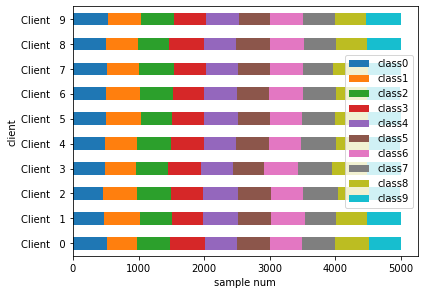

In [18]:
csv_file = "./partition_reports/cifar10_balanced_dir0_5_10clients.csv"
partition_report(trainset.targets, balanced_dir0_5_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

balanced_dir0_5_part_df = pd.read_csv(csv_file,header=1)
balanced_dir0_5_part_df = balanced_dir0_5_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    balanced_dir0_5_part_df[col] = (balanced_dir0_5_part_df[col] * balanced_dir0_5_part_df['Amount']).astype(int)

balanced_dir0_5_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_balanced_dir0_5_10clients.png", dpi=400)

## Balanced dirichlet (B=0.9)

In [19]:
balanced_dir0_9_part = CIFAR10Partitioner(trainset.targets,
                                      num_clients,
                                      balance=True,
                                      partition="dirichlet",
                                      dir_alpha=0.9,
                                      seed=seed)

Remaining Data: 50000
Remaining Data: 49999
Remaining Data: 49998
Remaining Data: 49997
Remaining Data: 49996
Remaining Data: 49995
Remaining Data: 49994
Remaining Data: 49993
Remaining Data: 49992
Remaining Data: 49991
Remaining Data: 49990
Remaining Data: 49989
Remaining Data: 49988
Remaining Data: 49987
Remaining Data: 49986
Remaining Data: 49985
Remaining Data: 49984
Remaining Data: 49983
Remaining Data: 49982
Remaining Data: 49981
Remaining Data: 49980
Remaining Data: 49979
Remaining Data: 49978
Remaining Data: 49977
Remaining Data: 49976
Remaining Data: 49975
Remaining Data: 49974
Remaining Data: 49973
Remaining Data: 49972
Remaining Data: 49971
Remaining Data: 49970
Remaining Data: 49969
Remaining Data: 49968
Remaining Data: 49967
Remaining Data: 49966
Remaining Data: 49965
Remaining Data: 49964
Remaining Data: 49963
Remaining Data: 49962
Remaining Data: 49961
Remaining Data: 49960
Remaining Data: 49959
Remaining Data: 49958
Remaining Data: 49957
Remaining Data: 49956
Remaining 

Remaining Data: 8794
Remaining Data: 8793
Remaining Data: 8792
Remaining Data: 8791
Remaining Data: 8790
Remaining Data: 8789
Remaining Data: 8788
Remaining Data: 8787
Remaining Data: 8786
Remaining Data: 8785
Remaining Data: 8784
Remaining Data: 8783
Remaining Data: 8782
Remaining Data: 8781
Remaining Data: 8780
Remaining Data: 8779
Remaining Data: 8778
Remaining Data: 8777
Remaining Data: 8776
Remaining Data: 8775
Remaining Data: 8774
Remaining Data: 8773
Remaining Data: 8772
Remaining Data: 8771
Remaining Data: 8770
Remaining Data: 8769
Remaining Data: 8768
Remaining Data: 8767
Remaining Data: 8766
Remaining Data: 8765
Remaining Data: 8764
Remaining Data: 8763
Remaining Data: 8762
Remaining Data: 8761
Remaining Data: 8760
Remaining Data: 8759
Remaining Data: 8758
Remaining Data: 8757
Remaining Data: 8756
Remaining Data: 8755
Remaining Data: 8754
Remaining Data: 8753
Remaining Data: 8752
Remaining Data: 8751
Remaining Data: 8750
Remaining Data: 8749
Remaining Data: 8748
Remaining Dat

Remaining Data: 188
Remaining Data: 188
Remaining Data: 188
Remaining Data: 188
Remaining Data: 188
Remaining Data: 188
Remaining Data: 188
Remaining Data: 188
Remaining Data: 187
Remaining Data: 187
Remaining Data: 187
Remaining Data: 187
Remaining Data: 187
Remaining Data: 187
Remaining Data: 187
Remaining Data: 187
Remaining Data: 186
Remaining Data: 186
Remaining Data: 186
Remaining Data: 185
Remaining Data: 184
Remaining Data: 184
Remaining Data: 183
Remaining Data: 183
Remaining Data: 182
Remaining Data: 181
Remaining Data: 181
Remaining Data: 181
Remaining Data: 181
Remaining Data: 181
Remaining Data: 180
Remaining Data: 180
Remaining Data: 179
Remaining Data: 179
Remaining Data: 179
Remaining Data: 179
Remaining Data: 179
Remaining Data: 178
Remaining Data: 178
Remaining Data: 177
Remaining Data: 177
Remaining Data: 177
Remaining Data: 176
Remaining Data: 176
Remaining Data: 176
Remaining Data: 176
Remaining Data: 175
Remaining Data: 174
Remaining Data: 173
Remaining Data: 173


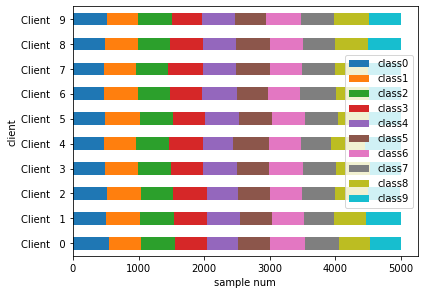

In [20]:
csv_file = "./partition_reports/cifar10_balanced_dir0_9_10clients.csv"
partition_report(trainset.targets, balanced_dir0_9_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

balanced_dir0_9_part_df = pd.read_csv(csv_file,header=1)
balanced_dir0_9_part_df = balanced_dir0_9_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    balanced_dir0_9_part_df[col] = (balanced_dir0_9_part_df[col] * balanced_dir0_9_part_df['Amount']).astype(int)

balanced_dir0_9_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_balanced_dir0_9_10clients.png", dpi=400)

## Unbalanced dirichlet (B=0.3)

In [21]:
unbalanced_dir0_3_part = CIFAR10Partitioner(trainset.targets,
                                        num_clients,
                                        balance=False,
                                        partition="dirichlet",
                                        unbalance_sgm=0.3,
                                        dir_alpha=0.3,
                                        seed=seed)

Remaining Data: 50000
Remaining Data: 49999
Remaining Data: 49998
Remaining Data: 49997
Remaining Data: 49996
Remaining Data: 49995
Remaining Data: 49994
Remaining Data: 49993
Remaining Data: 49992
Remaining Data: 49991
Remaining Data: 49990
Remaining Data: 49989
Remaining Data: 49988
Remaining Data: 49987
Remaining Data: 49986
Remaining Data: 49985
Remaining Data: 49984
Remaining Data: 49983
Remaining Data: 49982
Remaining Data: 49981
Remaining Data: 49980
Remaining Data: 49979
Remaining Data: 49978
Remaining Data: 49977
Remaining Data: 49976
Remaining Data: 49975
Remaining Data: 49974
Remaining Data: 49973
Remaining Data: 49972
Remaining Data: 49971
Remaining Data: 49970
Remaining Data: 49969
Remaining Data: 49968
Remaining Data: 49967
Remaining Data: 49966
Remaining Data: 49965
Remaining Data: 49964
Remaining Data: 49963
Remaining Data: 49962
Remaining Data: 49961
Remaining Data: 49960
Remaining Data: 49959
Remaining Data: 49958
Remaining Data: 49957
Remaining Data: 49956
Remaining 

Remaining Data: 19059
Remaining Data: 19058
Remaining Data: 19057
Remaining Data: 19056
Remaining Data: 19055
Remaining Data: 19054
Remaining Data: 19053
Remaining Data: 19052
Remaining Data: 19051
Remaining Data: 19050
Remaining Data: 19049
Remaining Data: 19048
Remaining Data: 19047
Remaining Data: 19046
Remaining Data: 19045
Remaining Data: 19044
Remaining Data: 19043
Remaining Data: 19042
Remaining Data: 19041
Remaining Data: 19040
Remaining Data: 19039
Remaining Data: 19038
Remaining Data: 19037
Remaining Data: 19036
Remaining Data: 19035
Remaining Data: 19034
Remaining Data: 19033
Remaining Data: 19032
Remaining Data: 19031
Remaining Data: 19030
Remaining Data: 19029
Remaining Data: 19028
Remaining Data: 19027
Remaining Data: 19026
Remaining Data: 19025
Remaining Data: 19024
Remaining Data: 19023
Remaining Data: 19022
Remaining Data: 19021
Remaining Data: 19020
Remaining Data: 19019
Remaining Data: 19018
Remaining Data: 19017
Remaining Data: 19016
Remaining Data: 19015
Remaining 

Remaining Data: 4636
Remaining Data: 4636
Remaining Data: 4636
Remaining Data: 4636
Remaining Data: 4635
Remaining Data: 4634
Remaining Data: 4634
Remaining Data: 4633
Remaining Data: 4632
Remaining Data: 4632
Remaining Data: 4632
Remaining Data: 4631
Remaining Data: 4630
Remaining Data: 4630
Remaining Data: 4629
Remaining Data: 4629
Remaining Data: 4629
Remaining Data: 4628
Remaining Data: 4628
Remaining Data: 4627
Remaining Data: 4627
Remaining Data: 4626
Remaining Data: 4625
Remaining Data: 4624
Remaining Data: 4624
Remaining Data: 4623
Remaining Data: 4623
Remaining Data: 4623
Remaining Data: 4622
Remaining Data: 4622
Remaining Data: 4622
Remaining Data: 4622
Remaining Data: 4621
Remaining Data: 4620
Remaining Data: 4620
Remaining Data: 4619
Remaining Data: 4618
Remaining Data: 4617
Remaining Data: 4617
Remaining Data: 4617
Remaining Data: 4617
Remaining Data: 4616
Remaining Data: 4616
Remaining Data: 4616
Remaining Data: 4615
Remaining Data: 4615
Remaining Data: 4614
Remaining Dat

Remaining Data: 2774
Remaining Data: 2773
Remaining Data: 2772
Remaining Data: 2771
Remaining Data: 2770
Remaining Data: 2770
Remaining Data: 2769
Remaining Data: 2769
Remaining Data: 2768
Remaining Data: 2768
Remaining Data: 2767
Remaining Data: 2767
Remaining Data: 2766
Remaining Data: 2766
Remaining Data: 2766
Remaining Data: 2766
Remaining Data: 2765
Remaining Data: 2764
Remaining Data: 2764
Remaining Data: 2763
Remaining Data: 2762
Remaining Data: 2761
Remaining Data: 2760
Remaining Data: 2760
Remaining Data: 2759
Remaining Data: 2759
Remaining Data: 2758
Remaining Data: 2757
Remaining Data: 2756
Remaining Data: 2756
Remaining Data: 2756
Remaining Data: 2756
Remaining Data: 2756
Remaining Data: 2756
Remaining Data: 2756
Remaining Data: 2755
Remaining Data: 2754
Remaining Data: 2754
Remaining Data: 2754
Remaining Data: 2754
Remaining Data: 2753
Remaining Data: 2753
Remaining Data: 2752
Remaining Data: 2751
Remaining Data: 2751
Remaining Data: 2751
Remaining Data: 2751
Remaining Dat

Remaining Data: 1454
Remaining Data: 1454
Remaining Data: 1454
Remaining Data: 1454
Remaining Data: 1453
Remaining Data: 1453
Remaining Data: 1453
Remaining Data: 1453
Remaining Data: 1452
Remaining Data: 1451
Remaining Data: 1450
Remaining Data: 1450
Remaining Data: 1450
Remaining Data: 1450
Remaining Data: 1450
Remaining Data: 1450
Remaining Data: 1450
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1449
Remaining Data: 1448
Remaining Data: 1448
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1447
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Data: 1446
Remaining Dat

Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 911
Remaining Data: 910
Remaining Data: 910
Remaining Data: 910
Remaining Data: 909
Remaining Data: 909
Remaining Data: 909
Remaining Data: 909
Remaining Data: 909
Remaining Data: 908
Remaining Data: 908
Remaining Data: 907
Remaining Data: 907
Remaining Data: 907
Remaining Data: 907
Remaining Data: 907
Remaining Data: 907
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 906
Remaining Data: 905
Remaining Data: 905
Remaining Data: 904
Remaining Data: 903
Remaining Data: 902
Remaining Data: 901


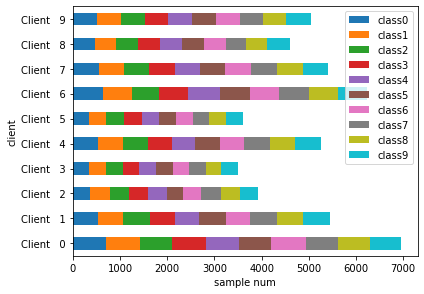

In [22]:
csv_file = "./partition_reports/cifar10_unbalanced_dir0_3_10clients.csv"
partition_report(trainset.targets, unbalanced_dir0_3_part.client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

unbalanced_dir0_3_part_df = pd.read_csv(csv_file,header=1)
unbalanced_dir0_3_part_df = unbalanced_dir0_3_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    unbalanced_dir0_3_part_df[col] = (unbalanced_dir0_3_part_df[col] * unbalanced_dir0_3_part_df['Amount']).astype(int)

unbalanced_dir0_3_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_unbalanced_dir0_3_10clients.png", dpi=400)

# Functions to create and return client_dicts

## Hetero-Dirichlet

In [343]:
def genHeteroDirPartitions(trainset_targets, num_clients, balance, partition, dir_alpha, seed, num_classes, dir_name):
    hetero_dir_part = CIFAR10Partitioner(trainset_targets,
                                         num_clients,
                                         balance=balance,
                                         partition=partition,
                                         dir_alpha=dir_alpha,
                                         seed=seed)
    
    csv_file = "./partition_reports/cifar10_hetero_dir_" + str(dir_alpha) + "_" + str(num_clients) + "clients.csv"
    partition_report(trainset_targets, hetero_dir_part.client_dict,
                     class_num=num_classes,
                     verbose=False, file=csv_file)
    
    hetero_dir_part_df = pd.read_csv(csv_file,header=1)
    hetero_dir_part_df = hetero_dir_part_df.set_index('client')
    col_names = [f"class{i}" for i in range(num_classes)]
    for col in col_names:
        hetero_dir_part_df[col] = (hetero_dir_part_df[col] * hetero_dir_part_df['Amount']).astype(int)
        
    hetero_dir_part_df[col_names].iloc[:10].plot.barh(stacked=True)
    plt.tight_layout()
    plt.xlabel('sample num')
    plt.savefig(f"./imgs/cifar10_hetero_dir_" + str(dir_alpha) + "_" + str(num_clients) + "clients.png", dpi=400)
    
    return hetero_dir_part.client_dict

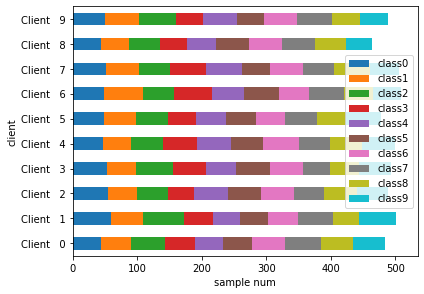

In [344]:
hetero_dir_part_client_dict = genHeteroDirPartitions(trainset_targets = trainset.targets,
                                                     num_clients = num_clients,
                                                     balance = None,
                                                     partition = "dirichlet",
                                                     dir_alpha = 100,
                                                     seed = seed,
                                                     num_classes = num_classes,
                                                     dir_name = "hetero_dirichlet")

## Balanced IID

In [22]:
def genBalancedIIDPartitions(trainset_targets, num_clients, balance, partition, seed, num_classes, dir_name):
    balanced_iid_part = CIFAR10Partitioner(trainset_targets,
                                          num_clients,
                                          balance=True,
                                          partition="iid",
                                          seed=seed)

    csv_file = "./partition_reports/cifar10_balanced_iid_" + str(num_clients) + "clients.csv"
    partition_report(trainset.targets, balanced_iid_part.client_dict,
                     class_num=num_classes,
                     verbose=False, file=csv_file)

    balanced_iid_part_df = pd.read_csv(csv_file,header=1)
    balanced_iid_part_df = balanced_iid_part_df.set_index('client')
    col_names = [f"class{i}" for i in range(num_classes)]
    for col in col_names:
        balanced_iid_part_df[col] = (balanced_iid_part_df[col] * balanced_iid_part_df['Amount']).astype(int)

    balanced_iid_part_df[col_names].iloc[:100].plot.barh(stacked=True)
    plt.tight_layout()
    plt.xlabel('sample num')
    plt.savefig(f"./imgs/cifar10_balanced_iid_" + str(num_clients) + "clients.pdf", dpi=400)
    
    return balanced_iid_part.client_dict

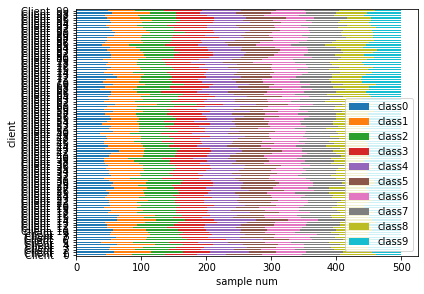

In [23]:
balanced_iid_part_client_dict = genBalancedIIDPartitions(trainset_targets = trainset.targets,
                                                         num_clients = num_clients,
                                                         balance = True,
                                                         partition = "iid",
                                                         seed = seed,
                                                         num_classes = num_classes,
                                                         dir_name = "balanced_iid")

## Unbalanced IID

In [147]:
def genUnbalancedIIDPartitions(trainset_targets, num_clients, balance, partition, unbalance_sgm, seed, num_classes, dir_name):
    unbalanced_iid_part = CIFAR10Partitioner(trainset_targets,
                                        num_clients,
                                        balance=False,
                                        partition="iid",
                                        unbalance_sgm=unbalance_sgm,
                                        seed=seed)
    
    csv_file = "./partition_reports/cifar10_unbalanced_" + str(unbalance_sgm) + "_iid_" + str(num_clients) + "clients.csv"
    partition_report(trainset.targets, unbalanced_iid_part.client_dict,
                     class_num=num_classes,
                     verbose=False, file=csv_file)

    unbalanced_iid_part_df = pd.read_csv(csv_file,header=1)
    unbalanced_iid_part_df = unbalanced_iid_part_df.set_index('client')
    col_names = [f"class{i}" for i in range(num_classes)]
    for col in col_names:
        unbalanced_iid_part_df[col] = (unbalanced_iid_part_df[col] * unbalanced_iid_part_df['Amount']).astype(int)

    unbalanced_iid_part_df[col_names].iloc[:10].plot.barh(stacked=True)
    plt.tight_layout()
    plt.xlabel('sample num')
    plt.savefig(f"./imgs/cifar10_unbalanced_" + str(unbalance_sgm) + "_iid_" + str(num_clients) + "clients.pdf", dpi=400)
    
    return unbalanced_iid_part.client_dict    

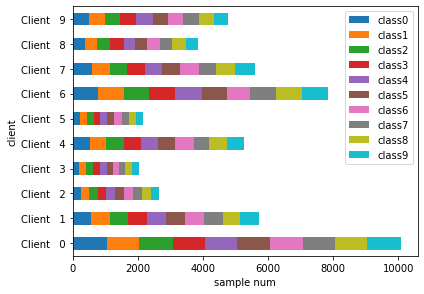

In [149]:
unbalanced_iid_part_client_dict = genUnbalancedIIDPartitions(trainset_targets = trainset.targets,
                                                             num_clients = num_clients,
                                                             balance = True,
                                                             partition = "iid",
                                                             unbalance_sgm = 0.7,
                                                             seed = seed,
                                                             num_classes = num_classes,
                                                             dir_name = "unbalanced_iid")

## Balanced dirichlet

In [34]:
# balance = None => Hetero-dirichlet
# balance = True => Balanced dirichlet

In [132]:
def genBalancedDirPartitions(trainset_targets, num_clients, balance, partition, dir_alpha, seed, num_classes, dir_name):
    balanced_dir_part = CIFAR10Partitioner(trainset_targets,
                                      num_clients,
                                      balance=balance,
                                      partition=partition,
                                      dir_alpha=dir_alpha,
                                      seed=seed)
    csv_file = "./partition_reports/cifar10_balanced_dir_" + str(dir_alpha) + "_" + str(num_clients) + "clients.csv"
    partition_report(trainset.targets, balanced_dir_part.client_dict,
                     class_num=num_classes,
                     verbose=False, file=csv_file)

    balanced_dir_part_df = pd.read_csv(csv_file,header=1)
    balanced_dir_part_df = balanced_dir_part_df.set_index('client')
    col_names = [f"class{i}" for i in range(num_classes)]
    for col in col_names:
        balanced_dir_part_df[col] = (balanced_dir_part_df[col] * balanced_dir_part_df['Amount']).astype(int)

    balanced_dir_part_df[col_names].iloc[:10].plot.barh(stacked=True)
    plt.tight_layout()
    plt.xlabel('sample num')
    plt.savefig(f"./imgs/cifar10_balanced_dir_" + str(dir_alpha) + "_" + str(num_clients) + "clients.pdf", dpi=400)
    
    return balanced_dir_part.client_dict

Remaining Data: 50000
Remaining Data: 49999
Remaining Data: 49998
Remaining Data: 49997
Remaining Data: 49996
Remaining Data: 49995
Remaining Data: 49994
Remaining Data: 49993
Remaining Data: 49992
Remaining Data: 49991
Remaining Data: 49990
Remaining Data: 49989
Remaining Data: 49988
Remaining Data: 49987
Remaining Data: 49986
Remaining Data: 49985
Remaining Data: 49984
Remaining Data: 49983
Remaining Data: 49982
Remaining Data: 49981
Remaining Data: 49980
Remaining Data: 49979
Remaining Data: 49978
Remaining Data: 49977
Remaining Data: 49976
Remaining Data: 49975
Remaining Data: 49974
Remaining Data: 49973
Remaining Data: 49972
Remaining Data: 49971
Remaining Data: 49970
Remaining Data: 49969
Remaining Data: 49968
Remaining Data: 49967
Remaining Data: 49966
Remaining Data: 49965
Remaining Data: 49964
Remaining Data: 49963
Remaining Data: 49962
Remaining Data: 49961
Remaining Data: 49960
Remaining Data: 49959
Remaining Data: 49958
Remaining Data: 49957
Remaining Data: 49956
Remaining 

Remaining Data: 812
Remaining Data: 811
Remaining Data: 811
Remaining Data: 810
Remaining Data: 809
Remaining Data: 808
Remaining Data: 807
Remaining Data: 806
Remaining Data: 805
Remaining Data: 804
Remaining Data: 804
Remaining Data: 803
Remaining Data: 802
Remaining Data: 801
Remaining Data: 801
Remaining Data: 801
Remaining Data: 800
Remaining Data: 799
Remaining Data: 798
Remaining Data: 798
Remaining Data: 798
Remaining Data: 798
Remaining Data: 797
Remaining Data: 796
Remaining Data: 795
Remaining Data: 794
Remaining Data: 793
Remaining Data: 793
Remaining Data: 792
Remaining Data: 791
Remaining Data: 791
Remaining Data: 791
Remaining Data: 790
Remaining Data: 789
Remaining Data: 788
Remaining Data: 787
Remaining Data: 787
Remaining Data: 786
Remaining Data: 785
Remaining Data: 784
Remaining Data: 783
Remaining Data: 782
Remaining Data: 781
Remaining Data: 781
Remaining Data: 780
Remaining Data: 779
Remaining Data: 778
Remaining Data: 777
Remaining Data: 776
Remaining Data: 776


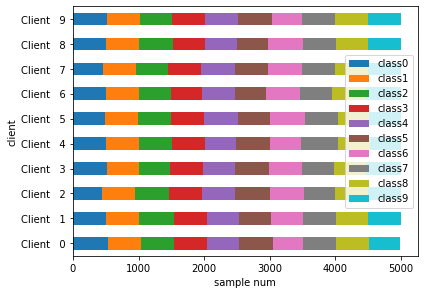

In [133]:
balanced_dir_part_client_dict = genBalancedDirPartitions(trainset_targets = trainset.targets,
                                                         num_clients = num_clients,
                                                         balance = True,
                                                         partition = "dirichlet",
                                                         dir_alpha = 0.7,
                                                         seed = seed,
                                                         num_classes = num_classes,
                                                         dir_name = "balanced_dirichlet")

## Unbalanced dirichlet

In [76]:
def genUnbalancedDirPartitions(trainset_targets, num_clients, balance, partition, dir_alpha, unbalance_sgm, seed, num_classes, dir_name):
    unbalanced_dir_part = CIFAR10Partitioner(trainset_targets,
                                             num_clients,
                                             balance=balance,
                                             partition=partition,
                                             dir_alpha=dir_alpha,
                                             unbalance_sgm = unbalance_sgm,
                                             seed=seed)
    csv_file = "./partition_reports/cifar10_unbalanced_" + str(unbalance_sgm) + "_dir_" + str(dir_alpha) + "_" + str(num_clients) + "clients.csv"
    partition_report(trainset.targets, unbalanced_dir_part.client_dict,
                     class_num=num_classes,
                     verbose=False, file=csv_file)

    unbalanced_dir_part_df = pd.read_csv(csv_file,header=1)
    unbalanced_dir_part_df = unbalanced_dir_part_df.set_index('client')
    col_names = [f"class{i}" for i in range(num_classes)]
    for col in col_names:
        unbalanced_dir_part_df[col] = (unbalanced_dir_part_df[col] * unbalanced_dir_part_df['Amount']).astype(int)

    unbalanced_dir_part_df[col_names].iloc[:10].plot.barh(stacked=True)
    plt.tight_layout()
    plt.xlabel('sample num')
    plt.savefig(f"./imgs/cifar10_unbalanced_" + str(unbalance_sgm) + "_dir_" + str(dir_alpha) + "_" + str(num_clients) + "clients.pdf", dpi=400)
    
    return unbalanced_dir_part.client_dict

Remaining Data: 50000
Remaining Data: 49999
Remaining Data: 49998
Remaining Data: 49997
Remaining Data: 49996
Remaining Data: 49995
Remaining Data: 49994
Remaining Data: 49993
Remaining Data: 49992
Remaining Data: 49991
Remaining Data: 49990
Remaining Data: 49989
Remaining Data: 49988
Remaining Data: 49987
Remaining Data: 49986
Remaining Data: 49985
Remaining Data: 49984
Remaining Data: 49983
Remaining Data: 49982
Remaining Data: 49981
Remaining Data: 49980
Remaining Data: 49979
Remaining Data: 49978
Remaining Data: 49977
Remaining Data: 49976
Remaining Data: 49975
Remaining Data: 49974
Remaining Data: 49973
Remaining Data: 49972
Remaining Data: 49971
Remaining Data: 49970
Remaining Data: 49969
Remaining Data: 49968
Remaining Data: 49967
Remaining Data: 49966
Remaining Data: 49965
Remaining Data: 49964
Remaining Data: 49963
Remaining Data: 49962
Remaining Data: 49961
Remaining Data: 49960
Remaining Data: 49959
Remaining Data: 49958
Remaining Data: 49957
Remaining Data: 49956
Remaining 

Remaining Data: 17666
Remaining Data: 17665
Remaining Data: 17664
Remaining Data: 17663
Remaining Data: 17662
Remaining Data: 17661
Remaining Data: 17660
Remaining Data: 17659
Remaining Data: 17658
Remaining Data: 17657
Remaining Data: 17656
Remaining Data: 17655
Remaining Data: 17654
Remaining Data: 17653
Remaining Data: 17652
Remaining Data: 17651
Remaining Data: 17650
Remaining Data: 17649
Remaining Data: 17648
Remaining Data: 17647
Remaining Data: 17646
Remaining Data: 17645
Remaining Data: 17644
Remaining Data: 17643
Remaining Data: 17642
Remaining Data: 17641
Remaining Data: 17640
Remaining Data: 17639
Remaining Data: 17638
Remaining Data: 17637
Remaining Data: 17636
Remaining Data: 17635
Remaining Data: 17634
Remaining Data: 17633
Remaining Data: 17632
Remaining Data: 17631
Remaining Data: 17630
Remaining Data: 17629
Remaining Data: 17628
Remaining Data: 17627
Remaining Data: 17626
Remaining Data: 17625
Remaining Data: 17624
Remaining Data: 17623
Remaining Data: 17622
Remaining 

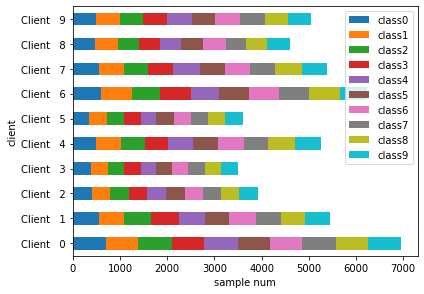

In [112]:
unbalanced_dir_part_client_dict = genUnbalancedDirPartitions(trainset_targets = trainset.targets,
                                                             num_clients = num_clients,
                                                             balance = False,
                                                             partition = "dirichlet",
                                                             dir_alpha = 0.7,
                                                             unbalance_sgm = 0.3,
                                                             seed = seed,
                                                             num_classes = num_classes,
                                                             dir_name = "unbalanced_dirichlet")

In [345]:
import json
import os
import math

In [346]:
# client_id to region mapping
client_to_region = {}
client_to_region[0] = "default/us"
client_to_region[1] = "default/us"

client_to_region[2] = "default/uk"
client_to_region[3] = "default/uk"

client_to_region[4] = "default/southAfrica"
client_to_region[5] = "default/southAfrica"

client_to_region[6] = "default/india"
client_to_region[7] = "default/india"

client_to_region[8] = "default/australia"
client_to_region[9] = "default/australia"

In [347]:
def genTrainerConfigFromPartitionDict(partition_dict, base_config_dir, config_dir_name):
    # load base config into a variable
    base_config = {}
    print("base_config trying to read: ", os.path.join(base_config_dir, "base_config.json"))
    with open(os.path.join(base_config_dir, "base_config.json")) as base_config_json:
        base_config = json.load(base_config_json)
    
    # iterate over dict using a copy of base config
    for client_id, indices in partition_dict.items():
        new_trainer_config = base_config.copy()
        base_config_task_id = str(base_config["taskid"])
        # changing from last 3 to last 4 eats up the 0 but adds support for 1K trainers
        print("extracted last 4: ", base_config_task_id[-4:])
        base_config_task_id_last4_num = int(base_config_task_id[-4:])
        new_trainer_config_task_id_last4 = str(base_config_task_id_last4_num + client_id + 1)
        
        new_trainer_config_task_id = base_config_task_id.replace(base_config_task_id[len(base_config_task_id) - 4:], new_trainer_config_task_id_last4)
        
        indices_list = indices.tolist()
    
        # update key val with list in hyperparameters
        new_trainer_config["taskid"] = new_trainer_config_task_id
        new_trainer_config["hyperparameters"]["trainer_indices_list"] = indices_list
        new_trainer_config["realm"] = client_to_region[client_id % 10]
    
        # write out the new dict as json to config dir
        # Serializing json
        json_object = json.dumps(new_trainer_config, indent=4)

        # Writing to sample.json
        dir_exists = os.path.exists(os.path.join(base_config_dir, config_dir_name))
        if not dir_exists:
            # Create a new directory because it does not exist
            os.makedirs(os.path.join(base_config_dir, config_dir_name))
            print("The new directory for " + str(config_dir_name) + " is created!")
        
        with open(os.path.join(base_config_dir, config_dir_name, "trainer_" + str(client_id+1) + ".json"), "w+") as outfile:
            outfile.write(json_object)

In [348]:
base_config_dir = "/Users/dhruv/Documents/Academics/Summer_23/Dist_training_fault_tolerance/expt_configs/"
config_dir_name = "config_dir100_num100"
genTrainerConfigFromPartitionDict(hetero_dir_part_client_dict, base_config_dir, config_dir_name)

base_config trying to read:  /Users/dhruv/Documents/Academics/Summer_23/Dist_training_fault_tolerance/expt_configs/base_config.json
extracted last 4:  0370
The new directory for config_dir100_num100 is created!
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  0370
extracted last 4:  03

In [49]:
type(unbalanced_dir_part_client_dict[0])

numpy.ndarray

In [127]:
balanced_dir0_1_part = {}

In [128]:
balanced_dir0_1_part["client_dict"] = balanced_dir_part_client_dict

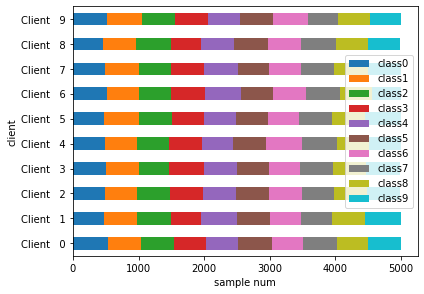

In [131]:
csv_file = "./partition_reports/cifar10_balanced_dir0_4_10clients.csv"
partition_report(trainset.targets, balanced_dir_part_client_dict,
                 class_num=num_classes,
                 verbose=False, file=csv_file)

balanced_dir0_1_part_df = pd.read_csv(csv_file,header=1)
balanced_dir0_1_part_df = balanced_dir0_1_part_df.set_index('client')
col_names = [f"class{i}" for i in range(num_classes)]
for col in col_names:
    balanced_dir0_1_part_df[col] = (balanced_dir0_1_part_df[col] * balanced_dir0_1_part_df['Amount']).astype(int)

balanced_dir0_1_part_df[col_names].iloc[:10].plot.barh(stacked=True)
plt.tight_layout()
plt.xlabel('sample num')
plt.savefig(f"./imgs/cifar10_balanced_dir0_4_10clients.pdf", dpi=400)

In [151]:
balanced_dir_part_client_dict = balanced_dir0_1_part["client_dict"].copy()

## Incorporating real world failure trace

In [6]:
# Read the client behave trace

In [7]:
client_behave_trace_path = '/Users/dhruv/Documents/Academics/Fall_23/FL_staleness/FedScale/benchmark/dataset/data/device_info/'

In [8]:
client_behavior = pd.read_pickle(os.path.join(client_behave_trace_path, "client_behave_trace"))

In [9]:
client_behavior

OrderedDict([(1,
              {'duration': 972262,
               'inactive': [59046, 87718, 161219, 1081886],
               'finish_time': 1123200,
               'active': [51490, 60870, 140727, 164520],
               'model': 'LG-K350'}),
             (2,
              {'duration': 691032,
               'inactive': [12823,
                658127,
                685128,
                715053,
                765786,
                843740,
                917249,
                917251],
               'finish_time': 950400,
               'active': [10596,
                12885,
                683099,
                713791,
                750327,
                834323,
                901855,
                917249],
               'model': 'CPH1909'}),
             (3,
              {'duration': 683891,
               'inactive': [109,
                4829,
                5790,
                6531,
                7062,
                7103,
                8804,
      

In [10]:
len(client_behavior)

107749

In [11]:
client_behavior[2]

{'duration': 691032,
 'inactive': [12823, 658127, 685128, 715053, 765786, 843740, 917249, 917251],
 'finish_time': 950400,
 'active': [10596, 12885, 683099, 713791, 750327, 834323, 901855, 917249],
 'model': 'CPH1909'}

In [122]:
print("num_clients: ", num_clients)

num_clients:  100


In [255]:
EXPT_DURATION_S = 90*60    # num_mins * 60 seconds
RNG_SEED = 42

In [256]:
print("EXPT_DURATION_S: ", EXPT_DURATION_S)

EXPT_DURATION_S:  5400


In [257]:
# select more clients from the failure trace so that you can remove
# all trace conversions that fall >2% off the original client behavior
OVERSAMPLING_CLIENT_RATIO = 2
MAX_TOLERABLE_ERROR = 2

In [258]:
def getListDeviceIDs(num_clients_to_pick, client_behavior_trace):
    np.random.seed(RNG_SEED)
    picked_client_ids = np.random.choice(range(1, len(client_behavior_trace)), num_clients_to_pick)
    
    return picked_client_ids

In [259]:
# Pick 2 times the num_clients so that those clients whose error is > 3% can be skipped
picked_client_ids = getListDeviceIDs(num_clients_to_pick = int(OVERSAMPLING_CLIENT_RATIO * num_clients), client_behavior_trace = client_behavior)

In [260]:
picked_client_ids

array([ 15796,    861, 103695,  76821,  54887,   6266,  82387,  37195,
        87499,  44132,  60264,  16024,  41091,  67222,  64821,    770,
        59736,  62956,  64926,  67970,   5312, 103356, 104725,  83105,
        53708,  85306,  28694,  71933,  93017, 106971,  25659,  84479,
        18432,   2748,  59151,  65726,  84655,  35774,  67436,  56887,
        66804,  31552,  11395,  69093,   3891,  41607,  96277,  80039,
        87314,  10628,   8793,  73970,  43002,  76553,  23898,  68149,
        23484,  48556,  17160, 106531,  80078,  35921,  92068,  67122,
        69480,  89476,  19458,  66558,  77190,  78954,  52996,  40758,
         9693,  45759,  72410,  71212,  65698,  37066,  92094,  99300,
        32607,  11535,  94664,  40398,  91388,   1017,  89790,  55592,
        89813,  23248,  24301,  74066,  82799,   9269,  86808,  12186,
        63705,  86780,  39100,   8572, 105513,  38045,  51215,  61229,
        48985,  40775,   2569,  62593,  67564,   2696,  48191,   5259,
      

In [296]:
def get_client_unavail_list(curr_client_id, client_behavior_trace, experiment_duration):
    # get client element from the dict
    client_desc = client_behavior_trace[curr_client_id]
    
    # finish -> end
    # start -> min(active, inactive)
    end_ts = client_desc['finish_time']
    start_ts = min(client_desc['active'][0], client_desc['inactive'][0])
#     print("overall days duration: ", (end_ts-start_ts)/86400)
    
    # scale current vectors to (0, expt_duration)
    updated_active_ts = []
    updated_inactive_ts = []
    
    updated_active_ts = scaleTimestamps(client_desc['active'], start_ts, end_ts, experiment_duration)
    updated_inactive_ts = scaleTimestamps(client_desc['inactive'], start_ts, end_ts, experiment_duration)
#     print("updated_active_ts: ", updated_active_ts, "\n updated_inactive_ts: ", updated_inactive_ts)
    
    
    # linearize the list with active inactive
    all_events = []
    
    # add end_ts too for one more check
    for ts in updated_active_ts:
        label = 'A'
        curr_timestamp_state = (label, ts)
        all_events.append(curr_timestamp_state)
    
    for ts in updated_inactive_ts:
        label = 'I'
        curr_timestamp_state = (label, ts)
        all_events.append(curr_timestamp_state)
    
    # sort this list based on timestamp which is at index 1
    all_events.sort(key = lambda x: x[1])
#     print("all_events: ", all_events)
    
    # get the values as alternating state change A->I->A...
    updated_events = alternating_state_change(all_events)
#     print("updated_events: ", updated_events)
    
    # get it in the format (next_failure_timestamp, duration_of_failure)
    # for each inactive->active transition, add an entry
    inactive_with_duration, ends_at_inactive = get_unavailability_durations(updated_events)
    
    # Add an entry for inactive->end
    if(ends_at_inactive):
        last_inactive_start_ts = updated_events[len(updated_events)-1][1]
        last_inactive_duration = experiment_duration - last_inactive_start_ts
        inactive_with_duration.append((last_inactive_start_ts, last_inactive_duration))
    
    # can do processing of inactive_with_duration here to convert
    # non-contiguous blocks of time into contiguous. Eg. [(10,1), (11, 10)] => [(10, 11)]
    merged_inactive_with_duration = merge_contiguous_blocks(inactive_with_duration)
    
    # calculate the unavailability on scaled and original
    scaled_unavail = round((compute_total_unavailability(merged_inactive_with_duration)/EXPT_DURATION_S)*100, 2)
    actual_unavail = round((actual_unavailability(client_id = curr_client_id, 
                                           client_behavior_trace = client_behavior_trace))*100, 2)
    
    # calculate error percent on error
    error_percent = round(abs(scaled_unavail-actual_unavail), 2)
    
    print("scaled vs actual unavail: ", scaled_unavail, ", ", 
          actual_unavail, " client_id: ", curr_client_id, ", error_percent: ", error_percent)
    
    # add 10s buffer so that trainers don't fail immediately at the start
    # NOTE: Tried temporary fix of 0 shift so that unaware gets correct representation
    # But seems to start from high avail (80%) in the trace itself, so will keep 0s.
    merged_inactive_with_duration = add_buffer_for_failure(shift_times_by_s = 0, unavail_list = merged_inactive_with_duration)
    
    return merged_inactive_with_duration, error_percent

In [297]:
def scaleTimestamps(list_timestamps, start_ts, end_ts, experiment_duration):
    list_updated_ts = []
    for ts in list_timestamps:
        updated_ts = math.floor(((ts - start_ts)/end_ts)*experiment_duration)
#         updated_ts = ts
        list_updated_ts.append(updated_ts)
    
    return list_updated_ts

In [298]:
def alternating_state_change(data):
    result = []
    current_state = None
    current_sum = 0

    for item_type, item_value in data:
        if current_state is None:
            current_state = item_type

        if item_type == current_state:
            current_sum = item_value # if two values of same state, take the latter value [lower avg error, higher peak error]
#             continue # if two values of same state, take earlier value [higher avg error, lower peak error]
        else:
            result.append((current_state, current_sum))
            current_state = item_type
            current_sum = item_value

    result.append((current_state, current_sum))
    return result

In [299]:
def get_unavailability_durations(data):
    result = []
    current_unavailability = 0
    ends_at_inactive = False
    
    for idx, (item_type, item_value) in enumerate(data):
        if item_type == "A":
            continue
        elif item_type == "I" and ((idx+1) != len(data)) and (data[idx+1][0] == "A"):
            unavail_start_ts = item_value
            unavail_duration_s = data[idx+1][1] - item_value
            result.append((unavail_start_ts, unavail_duration_s))
    
    if data[len(data)-1][0] == "I":
        ends_at_inactive = True
        
    return result, ends_at_inactive

In [300]:
def compute_total_unavailability(data):
    total_unavail = 0
    for start_ts, unavail_duration in data:
        total_unavail += unavail_duration
    
    return total_unavail

In [301]:
def actual_unavailability(client_id, client_behavior_trace):
    curr_client = client_behavior_trace[client_id]
    end_ts = curr_client['finish_time']
    avail_duration = curr_client['duration']
    start_ts = min(curr_client['active'][0], curr_client['inactive'][0])
    actual_unavail_duration = end_ts - start_ts - avail_duration
    
    percent_unavailable = actual_unavail_duration/(end_ts - start_ts)
    return percent_unavailable

In [302]:
def add_buffer_for_failure(shift_times_by_s, unavail_list):
    for idx, (unavail_start_ts, unavail_duration_s) in enumerate(unavail_list):
        updated_unavail_start_ts = unavail_start_ts + shift_times_by_s
        
        unavail_list[idx] = (updated_unavail_start_ts, unavail_duration_s)
    return unavail_list

In [303]:
def merge_contiguous_blocks(intervals):
    if not intervals:
        return []
    
    merged_intervals = []
    # Initialize with the first interval
    current_start, current_length = intervals[0]

    # Iterate through the rest of the intervals
    for start, length in intervals[1:]:
        if current_start + current_length == start:
            # Merge the intervals
            current_length += length
        else:
            # Save the current interval and move to the next
            merged_intervals.append((current_start, current_length))
            current_start, current_length = start, length

    # Append the last interval
    merged_intervals.append((current_start, current_length))

    return merged_intervals

In [304]:
client = 861
inactive_with_duration, error_percent = get_client_unavail_list(curr_client_id = client, 
                          client_behavior_trace = client_behavior, 
                          experiment_duration = EXPT_DURATION_S)

scaled vs actual unavail:  82.28 ,  59.7  client_id:  861 , error_percent:  22.58


In [305]:
avg_error_percent = 0
total_error_percent = 0
trainer_id = 0
trainer_to_inactivity_dict = {}
total_clients_with_excessive_error = 0

for client in picked_client_ids:
    inactive_with_duration, error_percent = get_client_unavail_list(curr_client_id = client, 
                          client_behavior_trace = client_behavior, 
                          experiment_duration = EXPT_DURATION_S)
    if error_percent > MAX_TOLERABLE_ERROR:
        total_clients_with_excessive_error += 1
        print("Client error was: ", error_percent, ", thus skipping")
        if total_clients_with_excessive_error > ((OVERSAMPLING_CLIENT_RATIO - 1) * num_clients):
            print("ERROR! Need to sample more clients, too many clients with excessive error")
            break
        continue
    trainer_id += 1
    total_error_percent += error_percent
    trainer_to_inactivity_dict[trainer_id] = inactive_with_duration
    
    if trainer_id == num_clients:
        print("Completed processing of ", num_clients, " clients. Exiting.")
        break

avg_error_percent = round(total_error_percent/len(picked_client_ids),2)
print("avg_error_percent: ", avg_error_percent)

scaled vs actual unavail:  73.7 ,  67.12  client_id:  15796 , error_percent:  6.58
Client error was:  6.58 , thus skipping
scaled vs actual unavail:  82.28 ,  59.7  client_id:  861 , error_percent:  22.58
Client error was:  22.58 , thus skipping
scaled vs actual unavail:  97.24 ,  94.83  client_id:  103695 , error_percent:  2.41
Client error was:  2.41 , thus skipping
scaled vs actual unavail:  77.57 ,  77.42  client_id:  76821 , error_percent:  0.15
scaled vs actual unavail:  89.67 ,  75.26  client_id:  54887 , error_percent:  14.41
Client error was:  14.41 , thus skipping
scaled vs actual unavail:  92.59 ,  53.39  client_id:  6266 , error_percent:  39.2
Client error was:  39.2 , thus skipping
scaled vs actual unavail:  98.93 ,  92.4  client_id:  82387 , error_percent:  6.53
Client error was:  6.53 , thus skipping
scaled vs actual unavail:  80.78 ,  76.83  client_id:  37195 , error_percent:  3.95
Client error was:  3.95 , thus skipping
scaled vs actual unavail:  94.74 ,  93.9  client_

In [306]:
client_behavior[861]

{'duration': 278207,
 'inactive': [939,
  2004,
  4627,
  4641,
  5121,
  5261,
  5392,
  29043,
  29367,
  29384,
  29399,
  29409,
  69698,
  69759,
  73667,
  77654,
  80984,
  81932,
  84142,
  96113,
  96310,
  115278,
  115294,
  117166,
  119775,
  119794,
  119795,
  120029,
  120039,
  127037,
  127044,
  132052,
  132320,
  140370,
  143050,
  143052,
  144004,
  145149,
  145890,
  146596,
  146807,
  148111,
  152605,
  158043,
  158064,
  158218,
  158229,
  158306,
  159656,
  159669,
  166592,
  166596,
  172674,
  172683,
  202561,
  228456,
  228466,
  229476,
  229837,
  229923,
  241842,
  241851,
  310193,
  310406,
  313706,
  316184,
  317165,
  343005,
  344469,
  389391,
  406422,
  406545,
  406561,
  406675,
  406751,
  406768,
  406784,
  406873,
  406889,
  406938,
  406957,
  406975,
  406990,
  407001,
  407042,
  407084,
  407113,
  407143,
  407158,
  407176,
  407201,
  407220,
  409128,
  415049,
  417703,
  418001,
  419264,
  420102,
  420158,
  4726

In [307]:
len(client_behavior[15796]['active'])

22

In [308]:
len(client_behavior[15796]['inactive'])

22

In [309]:
inactive_with_duration, error_percent = get_client_unavail_list(curr_client_id = 16024, 
                          client_behavior_trace = client_behavior, 
                          experiment_duration = EXPT_DURATION_S)

scaled vs actual unavail:  84.22 ,  67.33  client_id:  16024 , error_percent:  16.89


In [310]:
len(trainer_to_inactivity_dict)

100

In [311]:
trainer_to_inactivity_dict[1]

[(66, 1925), (2431, 46), (2478, 188), (2674, 161), (3226, 1439), (4970, 430)]

### Visualize the trainer availability of mobiperf trace

In [312]:
import matplotlib.pyplot as plt

def count_active_trainers(trainer_to_inactivity_dict, max_timestamp=EXPT_DURATION_S):
    # Initialize the list to hold the number of active trainers at each timestamp
    active_trainers_count = []

    # Iterate through each timestamp
    for timestamp in range(max_timestamp + 1):
        active_count = 0
        # Check each trainer's inactivity periods
        for inactivity_periods in trainer_to_inactivity_dict.values():
            is_active = True
            for start, duration in inactivity_periods:
                end = start + duration
                if start <= timestamp < end:
                    is_active = False
                    break
            if is_active:
                active_count += 1
        active_trainers_count.append(active_count)

    return active_trainers_count


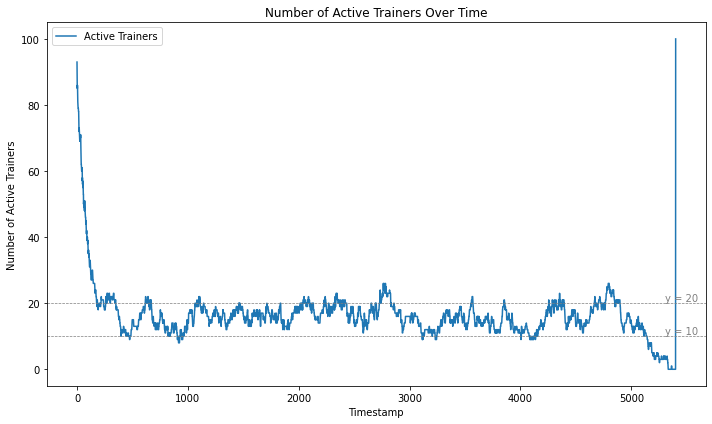

In [313]:
def plot_active_trainers(active_trainers_count, max_timestamp=EXPT_DURATION_S):
    # Plot the number of active trainers over time
    plt.figure(figsize=(10, 6))
    plt.plot(range(max_timestamp + 1), active_trainers_count, label='Active Trainers')
    
    # Add horizontal lines with labels at y = 10, y = 20
    for y_value in [10, 20]:
        plt.axhline(y=y_value, color='grey', linestyle='--', linewidth=0.7)
        plt.text(max_timestamp + 200, y_value, f'y = {y_value}', color='grey', 
                 verticalalignment='bottom', horizontalalignment='right')

    plt.xlabel('Timestamp')
    plt.ylabel('Number of Active Trainers')
    plt.title('Number of Active Trainers Over Time')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Calculate active trainers count
active_trainers_count = count_active_trainers(trainer_to_inactivity_dict)

# Plot the active trainers count
plot_active_trainers(active_trainers_count)

### Add the inactive durations to config files

In [34]:
# Add failure durations to json files

In [350]:
def update_failure_durations(directory_path, trainer_to_inactivity_dict, noFail):
    """
    Update the 'failure_durations_s' property in each JSON file in the specified directory.

    Parameters:
    - directory_path (str): The path to the directory containing JSON files.
    - new_value (str): The new value for the 'failure_durations_s' property.

    Returns:
    - None
    """
    # Loop through all files in the directory
    trainer_counter = 1
    for filename in os.listdir(directory_path):
        if filename.endswith(".json"):
            file_path = os.path.join(directory_path, filename)

            # Read the JSON file
            with open(file_path, 'r') as json_file:
                data = json.load(json_file)

            # Add or update the "failure_durations_s" key in the "hyperparameters" dictionary
            hyperparameters = data.get("hyperparameters", {})
            if noFail == True:
                hyperparameters["failure_durations_s"] = str([])
            elif noFail == False:
                hyperparameters["failure_durations_s"] = str(trainer_to_inactivity_dict[trainer_counter])
            data["hyperparameters"] = hyperparameters

            # Write the modified data back to the JSON file
            with open(file_path, 'w') as json_file:
                json.dump(data, json_file, indent=2)

            print(f"Updated {filename}")
            trainer_counter += 1

    print("Update completed.")

In [353]:
directory_path = "/Users/dhruv/Documents/Academics/Summer_23/Dist_training_fault_tolerance/expt_configs/config_dir100_num100_traceFail_1.5h"  # Replace with the actual path to your directory
update_failure_durations(directory_path, trainer_to_inactivity_dict, False)

# directory_path = "/Users/dhruv/Documents/Academics/Summer_23/Dist_training_fault_tolerance/expt_configs/config_dir1_num200_noFail"  # Replace with the actual path to your directory
# update_failure_durations(directory_path, trainer_to_inactivity_dict, True)

Updated trainer_71.json
Updated trainer_26.json
Updated trainer_30.json
Updated trainer_67.json
Updated trainer_88.json
Updated trainer_92.json
Updated trainer_7.json
Updated trainer_84.json
Updated trainer_10.json
Updated trainer_47.json
Updated trainer_51.json
Updated trainer_50.json
Updated trainer_100.json
Updated trainer_46.json
Updated trainer_11.json
Updated trainer_85.json
Updated trainer_6.json
Updated trainer_93.json
Updated trainer_66.json
Updated trainer_89.json
Updated trainer_31.json
Updated trainer_27.json
Updated trainer_70.json
Updated trainer_94.json
Updated trainer_1.json
Updated trainer_82.json
Updated trainer_16.json
Updated trainer_41.json
Updated trainer_57.json
Updated trainer_77.json
Updated trainer_98.json
Updated trainer_20.json
Updated trainer_36.json
Updated trainer_61.json
Updated trainer_60.json
Updated trainer_37.json
Updated trainer_21.json
Updated trainer_76.json
Updated trainer_99.json
Updated trainer_56.json
Updated trainer_40.json
Updated trainer_17

In [355]:
trainer_to_inactivity_dict[2]

[(36, 2298), (2362, 108), (2478, 10), (2595, 968), (3668, 1732)]

### Analysis of failure run

In [8]:
def createHistogramForParticipation(pariticipation_dict):
    data = pariticipation_dict

    # Extract values from the dictionary
    values = list(data.values())

    # Plot histogram
    plt.hist(values, bins=200, edgecolor='black')
    plt.title('Histogram of Data')
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.show()

In [9]:
# With failure

In [10]:
traceFail_participation_dict = {'505f9fc483cf4df68a2409257b5fad7d3c580378': 6, '505f9fc483cf4df68a2409257b5fad7d3c580381': 89, '505f9fc483cf4df68a2409257b5fad7d3c580401': 92, '505f9fc483cf4df68a2409257b5fad7d3c580376': 82, '505f9fc483cf4df68a2409257b5fad7d3c580406': 96, '505f9fc483cf4df68a2409257b5fad7d3c580444': 85, '505f9fc483cf4df68a2409257b5fad7d3c580461': 89, '505f9fc483cf4df68a2409257b5fad7d3c580446': 85, '505f9fc483cf4df68a2409257b5fad7d3c580422': 92, '505f9fc483cf4df68a2409257b5fad7d3c580388': 91, '505f9fc483cf4df68a2409257b5fad7d3c580468': 93, '505f9fc483cf4df68a2409257b5fad7d3c580392': 92, '505f9fc483cf4df68a2409257b5fad7d3c580418': 96, '505f9fc483cf4df68a2409257b5fad7d3c580372': 11, '505f9fc483cf4df68a2409257b5fad7d3c580453': 89, '505f9fc483cf4df68a2409257b5fad7d3c580426': 10, '505f9fc483cf4df68a2409257b5fad7d3c580421': 87, '505f9fc483cf4df68a2409257b5fad7d3c580396': 93, '505f9fc483cf4df68a2409257b5fad7d3c580417': 100, '505f9fc483cf4df68a2409257b5fad7d3c580431': 97, '505f9fc483cf4df68a2409257b5fad7d3c580445': 94, '505f9fc483cf4df68a2409257b5fad7d3c580470': 98, '505f9fc483cf4df68a2409257b5fad7d3c580466': 9, '505f9fc483cf4df68a2409257b5fad7d3c580395': 96, '505f9fc483cf4df68a2409257b5fad7d3c580408': 91, '505f9fc483cf4df68a2409257b5fad7d3c580456': 96, '505f9fc483cf4df68a2409257b5fad7d3c580407': 7, '505f9fc483cf4df68a2409257b5fad7d3c580452': 92, '505f9fc483cf4df68a2409257b5fad7d3c580419': 90, '505f9fc483cf4df68a2409257b5fad7d3c580375': 91, '505f9fc483cf4df68a2409257b5fad7d3c580405': 82, '505f9fc483cf4df68a2409257b5fad7d3c580454': 84, '505f9fc483cf4df68a2409257b5fad7d3c580434': 6, '505f9fc483cf4df68a2409257b5fad7d3c580371': 87, '505f9fc483cf4df68a2409257b5fad7d3c580425': 92, '505f9fc483cf4df68a2409257b5fad7d3c580455': 15, '505f9fc483cf4df68a2409257b5fad7d3c580441': 84, '505f9fc483cf4df68a2409257b5fad7d3c580403': 96, '505f9fc483cf4df68a2409257b5fad7d3c580387': 101, '505f9fc483cf4df68a2409257b5fad7d3c580442': 87, '505f9fc483cf4df68a2409257b5fad7d3c580427': 92, '505f9fc483cf4df68a2409257b5fad7d3c580443': 84, '505f9fc483cf4df68a2409257b5fad7d3c580438': 8, '505f9fc483cf4df68a2409257b5fad7d3c580423': 82, '505f9fc483cf4df68a2409257b5fad7d3c580383': 99, '505f9fc483cf4df68a2409257b5fad7d3c580411': 92, '505f9fc483cf4df68a2409257b5fad7d3c580416': 92, '505f9fc483cf4df68a2409257b5fad7d3c580399': 89, '505f9fc483cf4df68a2409257b5fad7d3c580410': 90, '505f9fc483cf4df68a2409257b5fad7d3c580409': 88, '505f9fc483cf4df68a2409257b5fad7d3c580430': 84, '505f9fc483cf4df68a2409257b5fad7d3c580420': 91, '505f9fc483cf4df68a2409257b5fad7d3c580412': 80, '505f9fc483cf4df68a2409257b5fad7d3c580390': 95, '505f9fc483cf4df68a2409257b5fad7d3c580402': 6, '505f9fc483cf4df68a2409257b5fad7d3c580429': 95, '505f9fc483cf4df68a2409257b5fad7d3c580459': 92, '505f9fc483cf4df68a2409257b5fad7d3c580436': 86, '505f9fc483cf4df68a2409257b5fad7d3c580394': 6, '505f9fc483cf4df68a2409257b5fad7d3c580413': 9, '505f9fc483cf4df68a2409257b5fad7d3c580467': 85, '505f9fc483cf4df68a2409257b5fad7d3c580450': 97, '505f9fc483cf4df68a2409257b5fad7d3c580462': 91, '505f9fc483cf4df68a2409257b5fad7d3c580385': 92, '505f9fc483cf4df68a2409257b5fad7d3c580439': 83, '505f9fc483cf4df68a2409257b5fad7d3c580457': 92, '505f9fc483cf4df68a2409257b5fad7d3c580404': 87, '505f9fc483cf4df68a2409257b5fad7d3c580400': 83, '505f9fc483cf4df68a2409257b5fad7d3c580432': 83, '505f9fc483cf4df68a2409257b5fad7d3c580460': 11, '505f9fc483cf4df68a2409257b5fad7d3c580374': 88, '505f9fc483cf4df68a2409257b5fad7d3c580382': 80, '505f9fc483cf4df68a2409257b5fad7d3c580379': 5, '505f9fc483cf4df68a2409257b5fad7d3c580386': 91, '505f9fc483cf4df68a2409257b5fad7d3c580464': 93, '505f9fc483cf4df68a2409257b5fad7d3c580377': 88, '505f9fc483cf4df68a2409257b5fad7d3c580449': 84, '505f9fc483cf4df68a2409257b5fad7d3c580469': 87, '505f9fc483cf4df68a2409257b5fad7d3c580389': 4, '505f9fc483cf4df68a2409257b5fad7d3c580424': 93, '505f9fc483cf4df68a2409257b5fad7d3c580373': 90, '505f9fc483cf4df68a2409257b5fad7d3c580414': 91, '505f9fc483cf4df68a2409257b5fad7d3c580463': 4, '505f9fc483cf4df68a2409257b5fad7d3c580448': 2, '505f9fc483cf4df68a2409257b5fad7d3c580433': 9, '505f9fc483cf4df68a2409257b5fad7d3c580437': 83, '505f9fc483cf4df68a2409257b5fad7d3c580451': 82, '505f9fc483cf4df68a2409257b5fad7d3c580465': 89, '505f9fc483cf4df68a2409257b5fad7d3c580398': 84, '505f9fc483cf4df68a2409257b5fad7d3c580380': 79, '505f9fc483cf4df68a2409257b5fad7d3c580435': 88, '505f9fc483cf4df68a2409257b5fad7d3c580391': 87, '505f9fc483cf4df68a2409257b5fad7d3c580428': 76, '505f9fc483cf4df68a2409257b5fad7d3c580440': 73, '505f9fc483cf4df68a2409257b5fad7d3c580384': 89, '505f9fc483cf4df68a2409257b5fad7d3c580393': 90, '505f9fc483cf4df68a2409257b5fad7d3c580458': 82, '505f9fc483cf4df68a2409257b5fad7d3c580447': 90, '505f9fc483cf4df68a2409257b5fad7d3c580415': 79, '505f9fc483cf4df68a2409257b5fad7d3c580397': 83}

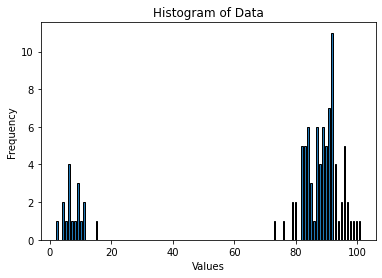

In [11]:
createHistogramForParticipation(traceFail_participation_dict)

In [4]:
# Without failure

In [12]:
noFail_participation_dict = {'505f9fc483cf4df68a2409257b5fad7d3c580417': 86, '505f9fc483cf4df68a2409257b5fad7d3c580460': 84, '505f9fc483cf4df68a2409257b5fad7d3c580438': 82, '505f9fc483cf4df68a2409257b5fad7d3c580470': 82, '505f9fc483cf4df68a2409257b5fad7d3c580454': 84, '505f9fc483cf4df68a2409257b5fad7d3c580419': 89, '505f9fc483cf4df68a2409257b5fad7d3c580427': 78, '505f9fc483cf4df68a2409257b5fad7d3c580376': 92, '505f9fc483cf4df68a2409257b5fad7d3c580395': 94, '505f9fc483cf4df68a2409257b5fad7d3c580436': 83, '505f9fc483cf4df68a2409257b5fad7d3c580401': 86, '505f9fc483cf4df68a2409257b5fad7d3c580393': 91, '505f9fc483cf4df68a2409257b5fad7d3c580447': 77, '505f9fc483cf4df68a2409257b5fad7d3c580389': 86, '505f9fc483cf4df68a2409257b5fad7d3c580444': 84, '505f9fc483cf4df68a2409257b5fad7d3c580461': 89, '505f9fc483cf4df68a2409257b5fad7d3c580385': 77, '505f9fc483cf4df68a2409257b5fad7d3c580469': 85, '505f9fc483cf4df68a2409257b5fad7d3c580450': 92, '505f9fc483cf4df68a2409257b5fad7d3c580372': 80, '505f9fc483cf4df68a2409257b5fad7d3c580383': 85, '505f9fc483cf4df68a2409257b5fad7d3c580425': 86, '505f9fc483cf4df68a2409257b5fad7d3c580374': 89, '505f9fc483cf4df68a2409257b5fad7d3c580397': 83, '505f9fc483cf4df68a2409257b5fad7d3c580409': 79, '505f9fc483cf4df68a2409257b5fad7d3c580462': 94, '505f9fc483cf4df68a2409257b5fad7d3c580441': 83, '505f9fc483cf4df68a2409257b5fad7d3c580422': 88, '505f9fc483cf4df68a2409257b5fad7d3c580403': 95, '505f9fc483cf4df68a2409257b5fad7d3c580443': 85, '505f9fc483cf4df68a2409257b5fad7d3c580377': 88, '505f9fc483cf4df68a2409257b5fad7d3c580382': 88, '505f9fc483cf4df68a2409257b5fad7d3c580408': 77, '505f9fc483cf4df68a2409257b5fad7d3c580392': 92, '505f9fc483cf4df68a2409257b5fad7d3c580390': 78, '505f9fc483cf4df68a2409257b5fad7d3c580467': 89, '505f9fc483cf4df68a2409257b5fad7d3c580464': 90, '505f9fc483cf4df68a2409257b5fad7d3c580373': 82, '505f9fc483cf4df68a2409257b5fad7d3c580446': 80, '505f9fc483cf4df68a2409257b5fad7d3c580415': 75, '505f9fc483cf4df68a2409257b5fad7d3c580396': 78, '505f9fc483cf4df68a2409257b5fad7d3c580380': 80, '505f9fc483cf4df68a2409257b5fad7d3c580453': 81, '505f9fc483cf4df68a2409257b5fad7d3c580414': 87, '505f9fc483cf4df68a2409257b5fad7d3c580391': 81, '505f9fc483cf4df68a2409257b5fad7d3c580406': 85, '505f9fc483cf4df68a2409257b5fad7d3c580434': 83, '505f9fc483cf4df68a2409257b5fad7d3c580407': 93, '505f9fc483cf4df68a2409257b5fad7d3c580455': 74, '505f9fc483cf4df68a2409257b5fad7d3c580439': 71, '505f9fc483cf4df68a2409257b5fad7d3c580371': 83, '505f9fc483cf4df68a2409257b5fad7d3c580433': 78, '505f9fc483cf4df68a2409257b5fad7d3c580456': 78, '505f9fc483cf4df68a2409257b5fad7d3c580378': 83, '505f9fc483cf4df68a2409257b5fad7d3c580388': 75, '505f9fc483cf4df68a2409257b5fad7d3c580459': 82, '505f9fc483cf4df68a2409257b5fad7d3c580442': 82, '505f9fc483cf4df68a2409257b5fad7d3c580381': 94, '505f9fc483cf4df68a2409257b5fad7d3c580430': 89, '505f9fc483cf4df68a2409257b5fad7d3c580384': 67, '505f9fc483cf4df68a2409257b5fad7d3c580457': 64, '505f9fc483cf4df68a2409257b5fad7d3c580428': 62, '505f9fc483cf4df68a2409257b5fad7d3c580424': 65, '505f9fc483cf4df68a2409257b5fad7d3c580398': 58, '505f9fc483cf4df68a2409257b5fad7d3c580451': 61, '505f9fc483cf4df68a2409257b5fad7d3c580463': 65, '505f9fc483cf4df68a2409257b5fad7d3c580379': 60, '505f9fc483cf4df68a2409257b5fad7d3c580435': 63, '505f9fc483cf4df68a2409257b5fad7d3c580387': 56, '505f9fc483cf4df68a2409257b5fad7d3c580400': 67, '505f9fc483cf4df68a2409257b5fad7d3c580413': 64, '505f9fc483cf4df68a2409257b5fad7d3c580432': 63, '505f9fc483cf4df68a2409257b5fad7d3c580452': 57, '505f9fc483cf4df68a2409257b5fad7d3c580402': 64, '505f9fc483cf4df68a2409257b5fad7d3c580431': 69, '505f9fc483cf4df68a2409257b5fad7d3c580465': 59, '505f9fc483cf4df68a2409257b5fad7d3c580405': 59, '505f9fc483cf4df68a2409257b5fad7d3c580426': 57, '505f9fc483cf4df68a2409257b5fad7d3c580375': 62, '505f9fc483cf4df68a2409257b5fad7d3c580445': 59, '505f9fc483cf4df68a2409257b5fad7d3c580458': 60, '505f9fc483cf4df68a2409257b5fad7d3c580421': 67, '505f9fc483cf4df68a2409257b5fad7d3c580411': 59, '505f9fc483cf4df68a2409257b5fad7d3c580404': 62, '505f9fc483cf4df68a2409257b5fad7d3c580466': 57, '505f9fc483cf4df68a2409257b5fad7d3c580449': 62, '505f9fc483cf4df68a2409257b5fad7d3c580412': 63, '505f9fc483cf4df68a2409257b5fad7d3c580399': 64, '505f9fc483cf4df68a2409257b5fad7d3c580468': 59, '505f9fc483cf4df68a2409257b5fad7d3c580423': 66, '505f9fc483cf4df68a2409257b5fad7d3c580448': 59, '505f9fc483cf4df68a2409257b5fad7d3c580386': 64, '505f9fc483cf4df68a2409257b5fad7d3c580418': 64, '505f9fc483cf4df68a2409257b5fad7d3c580410': 63, '505f9fc483cf4df68a2409257b5fad7d3c580440': 64, '505f9fc483cf4df68a2409257b5fad7d3c580416': 61, '505f9fc483cf4df68a2409257b5fad7d3c580420': 58, '505f9fc483cf4df68a2409257b5fad7d3c580429': 66, '505f9fc483cf4df68a2409257b5fad7d3c580437': 58, '505f9fc483cf4df68a2409257b5fad7d3c580394': 59}

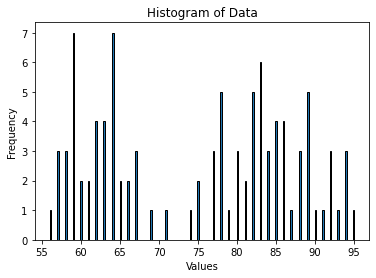

In [13]:
createHistogramForParticipation(noFail_participation_dict)

## Analysing device types in MobiPerf

In [7]:
from collections import Counter

In [8]:
# Extract models and count them using Counter
model_counts = Counter(entry['model'] for entry in client_behavior.values())

In [9]:
print(model_counts)

Counter({'CPH1909': 4229, 'CPH1803': 3210, 'RMX1941': 2133, 'vivo 1904': 1872, 'SM-A105M': 1774, 'CPH1923': 1725, 'vivo 1820': 1676, 'Redmi 6A': 1387, 'CPH1901': 1381, 'Redmi Note 4': 1298, 'SM-A105G': 1225, 'SM-G570M': 1199, 'Redmi 5A': 1185, 'SM-G532M': 1118, 'SM-G610M': 1088, 'Redmi 4A': 1057, 'Redmi 5 Plus': 1030, 'CPH1823': 1023, 'SM-G610F': 978, 'SM-J400M': 969, 'SM-A205G': 931, 'vivo 1724': 904, 'Redmi Note 7': 902, 'vivo 1807': 899, 'Redmi 4X': 845, 'CPH1801': 834, 'RMX1821': 832, 'Redmi Note 5A': 819, 'Redmi Note 5': 797, 'CPH1931': 797, 'A37f': 750, 'SM-A205F': 737, 'vivo 1901': 735, 'vivo 1902': 718, 'SM-J600G': 713, 'CPH1729': 691, 'CPH1911': 668, 'SM-G532G': 648, 'CPH1853': 645, 'CPH1819': 635, 'SM-J710MN': 626, 'SM-J415G': 616, 'Redmi S2': 605, 'SM-J700M': 601, 'vivo 1819': 588, 'vivo 1816': 580, 'Redmi 6': 567, 'moto e5 play': 554, 'RMX1911': 554, 'Mi A1': 550, 'SM-A305G': 546, 'vivo 1814': 536, 'Redmi 5': 519, 'vivo 1811': 510, 'vivo 1817': 504, 'SM-J610G': 491, 'CPH196

In [10]:
len(model_counts)

2935

In [12]:
## The trace contains too many unique models, giving us no idea about speed.
## So we will use FedBuff's half-normal distribution instead.

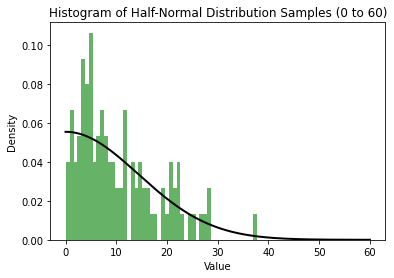

In [368]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import halfnorm

# Desired range
min_value = 0
max_value = 60

# Set the seed for reproducibility
np.random.seed(42)

# Calculate standard deviation for a normal distribution covering the range
std_dev = (max_value - min_value) / (2 * np.sqrt(2 * np.log(2)))

# Adjust the scale parameter for the half-normal distribution
scale = std_dev / np.sqrt(np.pi)

# Sample 10,000 points from the adjusted half-normal distribution
samples = halfnorm.rvs(scale=scale, size=num_clients)

# Plot the histogram of the sampled data points
plt.hist(samples, bins=50, density=True, alpha=0.6, color='g')

# Plot the theoretical PDF for comparison
x = np.linspace(min_value, max_value, 1000)
pdf = halfnorm.pdf(x, scale=scale)
plt.plot(x, pdf, 'k', linewidth=2)

plt.title('Histogram of Half-Normal Distribution Samples (0 to 60)')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()

In [369]:
std_dev

25.479654008640573

In [370]:
# samples generated are floating point nos. Convert them to ceil int
ceil_time_from_samples = np.ceil(samples)
ceil_time_from_samples

array([ 8.,  2., 10., 22.,  4.,  4., 23., 12.,  7.,  8.,  7.,  7.,  4.,
       28., 25.,  9., 15.,  5., 14., 21., 22.,  4.,  1., 21.,  8.,  2.,
       17.,  6.,  9.,  5.,  9., 27.,  1., 16., 12., 18.,  4., 29., 20.,
        3., 11.,  3.,  2.,  5., 22., 11.,  7., 16.,  5., 26.,  5.,  6.,
       10.,  9., 15., 14., 13.,  5.,  5., 15.,  7.,  3., 16., 18., 12.,
       20.,  2., 15.,  6., 10.,  6., 23.,  1., 23., 38., 12.,  2.,  5.,
        2., 29.,  4.,  6., 22.,  8., 12.,  8., 14.,  5.,  8.,  8.,  2.,
       14., 11.,  5.,  6., 22.,  5.,  4.,  1.,  4.])

In [371]:
trainer_to_delay_s_dict = {}
for i in range(1, num_clients+1):
    trainer_to_delay_s_dict[i] = ceil_time_from_samples[i-1]

In [372]:
# trainer_to_delay_s_dict

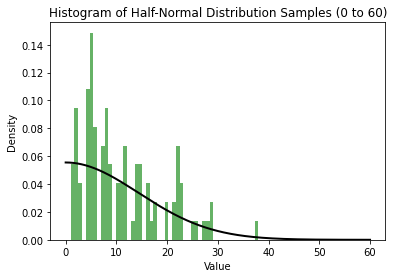

In [373]:
# Plot the histogram of the sampled data points
plt.hist(ceil_time_from_samples, bins=50, density=True, alpha=0.6, color='g')

# Plot the theoretical PDF for comparison
x = np.linspace(min_value, max_value, 1000)
pdf = halfnorm.pdf(x, scale=scale)
plt.plot(x, pdf, 'k', linewidth=2)

plt.title('Histogram of Half-Normal Distribution Samples (0 to 60)')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()

### Update json with device delay durations

In [364]:
def update_delay_durations(directory_path, trainer_to_delay_s_dict):
    """
    Update the 'delay_durations_s' property in each JSON file in the specified directory.

    Parameters:
    - directory_path (str): The path to the directory containing JSON files.
    - new_value (str): The new value for the 'failure_durations_s' property.

    Returns:
    - None
    """
    # Loop through all files in the directory
    trainer_counter = 1
    for filename in os.listdir(directory_path):
        if filename.endswith(".json"):
            file_path = os.path.join(directory_path, filename)

            # Read the JSON file
            with open(file_path, 'r') as json_file:
                data = json.load(json_file)

            # Add or update the "failure_durations_s" key in the "hyperparameters" dictionary
            hyperparameters = data.get("hyperparameters", {})
            hyperparameters["training_delay_s"] = str(trainer_to_delay_s_dict[trainer_counter])
            data["hyperparameters"] = hyperparameters

            # Write the modified data back to the JSON file
            with open(file_path, 'w') as json_file:
                json.dump(data, json_file, indent=2)

            print(f"Updated {filename}")
            trainer_counter += 1

    print("Update completed.")

In [366]:
directory_path = "/Users/dhruv/Documents/Academics/Summer_23/Dist_training_fault_tolerance/expt_configs/config_dir100_num100_traceFail_1.5h"  # Replace with the actual path to your directory
update_delay_durations(directory_path, trainer_to_delay_s_dict)

Updated trainer_71.json
Updated trainer_26.json
Updated trainer_30.json
Updated trainer_67.json
Updated trainer_88.json
Updated trainer_92.json
Updated trainer_7.json
Updated trainer_84.json
Updated trainer_10.json
Updated trainer_47.json
Updated trainer_51.json
Updated trainer_50.json
Updated trainer_100.json
Updated trainer_46.json
Updated trainer_11.json
Updated trainer_85.json
Updated trainer_6.json
Updated trainer_93.json
Updated trainer_66.json
Updated trainer_89.json
Updated trainer_31.json
Updated trainer_27.json
Updated trainer_70.json
Updated trainer_94.json
Updated trainer_1.json
Updated trainer_82.json
Updated trainer_16.json
Updated trainer_41.json
Updated trainer_57.json
Updated trainer_77.json
Updated trainer_98.json
Updated trainer_20.json
Updated trainer_36.json
Updated trainer_61.json
Updated trainer_60.json
Updated trainer_37.json
Updated trainer_21.json
Updated trainer_76.json
Updated trainer_99.json
Updated trainer_56.json
Updated trainer_40.json
Updated trainer_17